# A Network of Thrones - Season 5

---



**Marco Uderzo, ID 2096998**


marco.uderzo@studenti.unipd.it

In [1]:
!pip install igraph
!pip install cairocffi
!pip install scikit-network
!pip install networkx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 850.4 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 18.5 MB/s eta 0:00:00


In [2]:
import pandas as pd
import itertools
import networkx as nx
import igraph as ig
import ast
import cairocffi as cairo
import random
import math
import json
import numpy as np
import matplotlib.pyplot as plt
from sknetwork.clustering import get_modularity

In [3]:
from google.colab import drive
drive.mount('/content/drive')
folder = 'drive/MyDrive/NetworkScience/'

Mounted at /content/drive


In [4]:
relations_df = pd.read_csv(folder+"data/got-s5-edges.csv")
characters_df  = pd.read_csv(folder+"data/got-s5-nodes.csv")

In [5]:
# Delete self-loops - there are no self-loops in the data.

#self_loop = []
#for i in range(len(relations)):
#  if relations["Source"][i] == relations["Target"][i]:
#    self_loop.append(i)
#
#
#relations = relations.drop(set(self_loop)).reset_index()

In [6]:
import networkx as nx

# Check for duplicate Ids
duplicates = characters_df[characters_df.duplicated('Id', keep=False)]
if not duplicates.empty:
    print("Duplicate Ids found in characters_df:")
    print(duplicates)

# Remove duplicates based on Id (keeping the first occurrence)
characters_df = characters_df.drop_duplicates(subset='Id')

# Create the NetworkX graph from the edge list
G = nx.from_pandas_edgelist(relations_df, 'Source', 'Target', ['Weight'])

# Convert characters DataFrame to dictionary and add nodes with attributes
characters = characters_df.set_index('Id').to_dict('index')

G.add_nodes_from(characters.items())
print(G.nodes(data=True))
print(G.edges(data=True))


[('ARYA', {'Label': 'Arya'}), ('JAQEN', {'Label': 'Jaqen'}), ('JORAH', {'Label': 'Jorah'}), ('TYRION', {'Label': 'Tyrion'}), ('BRONN', {'Label': 'Bronn'}), ('JAIME', {'Label': 'Jaime'}), ('VARYS', {'Label': 'Varys'}), ('DAENERYS', {'Label': 'Daenerys'}), ('CERSEI', {'Label': 'Cersei'}), ('HIGH_SPARROW', {'Label': 'High Sparrow'}), ('BRIENNE', {'Label': 'Brienne'}), ('PODRICK', {'Label': 'Podrick'}), ('JON', {'Label': 'Jon'}), ('STANNIS', {'Label': 'Stannis'}), ('LITTLEFINGER', {'Label': 'Petyr'}), ('SANSA', {'Label': 'Sansa'}), ('SAM', {'Label': 'Sam'}), ('GILLY', {'Label': 'Gilly'}), ('DAARIO', {'Label': 'Daario'}), ('MARGAERY', {'Label': 'Margaery'}), ('TOMMEN', {'Label': 'Tommen'}), ('THEON', {'Label': 'Theon'}), ('HIZDAHR', {'Label': 'Hizdahr'}), ('DAVOS', {'Label': 'Davos'}), ('TORMUND', {'Label': 'Tormund'}), ('MYRCELLA', {'Label': 'Myrcella'}), ('MYRANDA', {'Label': 'Myranda'}), ('RAMSAY', {'Label': 'Ramsay'}), ('MELISANDRE', {'Label': 'Melisandre'}), ('ROOSE_BOLTON', {'Label': 

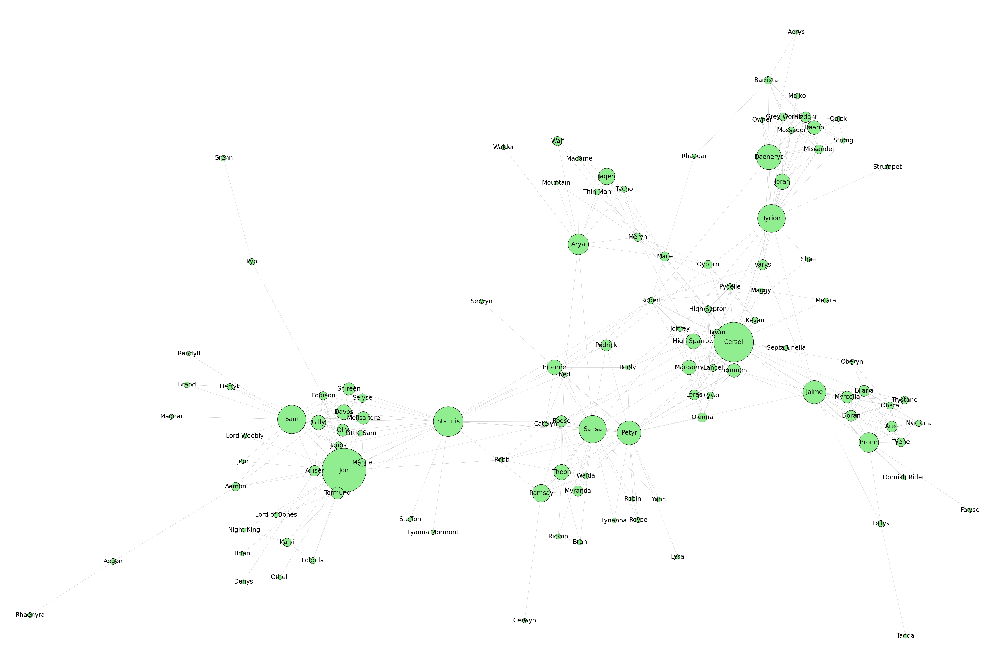

In [7]:
g = ig.Graph.from_networkx(G)

spring_layout = nx.spring_layout(G)


node_colors = ["LightGreen" for _ in range(len(G.nodes()))]


pagerank_scores = g.pagerank(weights='Weight')
pagerank_scores = np.array(pagerank_scores)
pagerank_scores_log = np.log1p(pagerank_scores)

# Set the node sizes based on PageRank
min_size = 20  # Minimum node size
max_size = 200  # Maximum node size
size_range = max_size - min_size
node_sizes = min_size + size_range * (pagerank_scores_log - np.min(pagerank_scores_log)) / (np.max(pagerank_scores_log) - np.min(pagerank_scores_log))


positions = spring_layout
g.vs["x"] = [positions[node][0] for node in G.nodes()]
g.vs["y"] = [positions[node][1] for node in G.nodes()]
g.vs["pagerank"] = pagerank_scores


fig, ax = plt.subplots(figsize=(45, 30))
ax.set_xlim(min(g.vs["x"])-0.05, max(g.vs["x"])+0.05)
ax.set_ylim(min(g.vs["y"])-0.05, max(g.vs["y"])+0.05)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in positions.values()],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"] if "Label" in g.vs.attributes() else None,
    vertex_label_size=20,
    edge_color="grey",
    edge_width=0.5
)

plt.show()



In [8]:
# Checking Strength of Connections between characters for quick and handy insights.

def get_edge_strength(G, node1, node2):
    # Check if the edge exists
    if G.has_edge(node1, node2) or G.has_edge(node2, node1):
        # Get the weight of the edge
        edge_weight = G[node1][node2]['Weight']
        # Get the degrees of the nodes
        degree_node1 = G.degree(node1)
        degree_node2 = G.degree(node2)
        # Compute the strength of the edge as the sum of the degrees and the weight
        edge_strength = edge_weight
        return edge_strength
    else:
        return None  # Edge does not exist


node1 = "SANSA"
node2 = "THEON"

edge_strength = get_edge_strength(G, node1, node2)

if edge_strength is not None:
    print(f"The strength of the edge between '{node1}' and '{node2}' is {edge_strength}.")
else:
    print(f"There is no edge between '{node1}' and '{node2}'.")

The strength of the edge between 'SANSA' and 'THEON' is 77.


Let's list the various characters

In [9]:
for nm in g.vs():
  print(nm['Label'])

Arya
Jaqen
Jorah
Tyrion
Bronn
Jaime
Varys
Daenerys
Cersei
High Sparrow
Brienne
Podrick
Jon
Stannis
Petyr
Sansa
Sam
Gilly
Daario
Margaery
Tommen
Theon
Hizdahr
Davos
Tormund
Myrcella
Myranda
Ramsay
Melisandre
Roose
Waif
Shireen
Qyburn
Olly
Barristan
Tyene
Doran
Ellaria
Mance
Alliser
Olenna
Loras
Grey Worm
Missandei
Mace
Mossador
Karsi
Areo
Trystane
Kevan
Maggy
Janos
Selyse
Tycho
Lancel
Pycelle
Aemon
Strumpet
Malko
Meryn
Loboda
Olyvar
Lollys
Septa Unella
Nymeria
Thin Man
High Septon
Dornish Rider
Melara
Tywin
Eddison
Lord of Bones
Brand
Derryk
Obara
Royce
Walda
Renly
Little Sam
Catelyn
Owner
Oberyn
Madame
Bran
Rickon
Robert
Ned
Night King
Robin
Quick
Strong
Yohn
Aegon
Aerys
Rhaegar
Joffrey
Jeor
Othell
Robb
Lynanna
Lysa
Lord Weebly
Shae
Rhaenyra
Denys
Mountain
Walder
Brian
Selwyn
Falyse
Cerwyn
Pyp
Grenn
Tanda
Lyanna Mormont
Magnar
Randyll
Steffon


### Size

In [10]:
nodes = g.vs()
edges = g.es()

print("Number of possible edges (N*(N-1)):", int(len(nodes)*(len(nodes)-1)/2))
print("Number of nodes (Graph Order):", len(nodes))
print("Number of edges (Graph Size):", len(edges))

# Graph Density: how connected are the nodes. Calculated by: n_edges/n_possible_edges
print("Graph Density:", g.density())

Number of possible edges (N*(N-1)): 6903
Number of nodes (Graph Order): 118
Number of edges (Graph Size): 395
Graph Density: 0.057221497899464


### Distribution

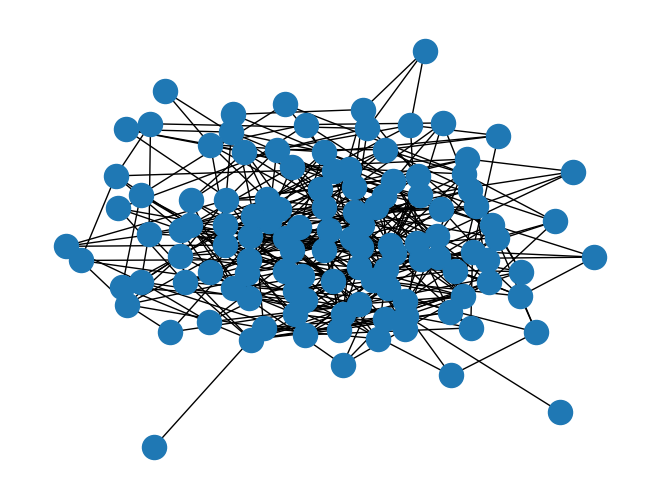

In [11]:
#Generate an appropriate ensemble of null-model networks, such as Erdős–Rényi random graphs, or Maslov–Sneppen random graphs.
rand_net = nx.erdos_renyi_graph(len(G.nodes()), len(G.edges())/(len(G.nodes())*(len(G.nodes()) - 1)/2), seed=None, directed=False)
nx.draw(rand_net)

In [12]:
#Calculate the average of the mean shortest path length Lr over this ensemble of null-model networks; calculate Cr analogously.
print("number of nodes in random net:", len(rand_net.nodes()), "number of edges in random net", len(rand_net.edges()))
print("average shortest path for the random network", nx.average_shortest_path_length(rand_net))
print("clustering coefficient for the random network", nx.average_clustering(rand_net))

number of nodes in random net: 118 number of edges in random net 409
average shortest path for the random network 2.659133709981168
clustering coefficient for the random network 0.0511114591623066


In [13]:
if nx.is_connected(G):
    avg_shortest_path = nx.average_shortest_path_length(G)
else:
    # Extract the largest connected component
    largest_cc = max(nx.connected_components(G), key=len)
    subgraph = G.subgraph(largest_cc)
    avg_shortest_path = nx.average_shortest_path_length(subgraph)


# Calculate the normalised shortest path λ:=L/Lr. and γ:=C/Cr
print("normalised average shortest path for the original network", avg_shortest_path / nx.average_shortest_path_length(rand_net))
print("normalised clustering coefficient for the original network", nx.average_clustering(G) / nx.average_clustering(rand_net))


normalised average shortest path for the original network 1.209468293745914
normalised clustering coefficient for the original network 11.348233279544557


The idea is that:
- Small-world networks should have some spatial structure, which is reflected by a high clustering coefficient.
By contrast, random networks have no such structure and a low clustering coefficient.
- Small-world networks are efficient in communicating and similar and thus have a small shortest path length,
comparable to that of random networks. By contrast, purely spatial networks have a high shortest path length.

In [14]:
# Calculate the normalised shortest path λ:=L/Lr. and γ:=C/Cr
lambda_val = avg_shortest_path / nx.average_shortest_path_length(rand_net)
gamma_val = nx.average_clustering(G) / nx.average_clustering(rand_net)

# Check small-world criteria
if lambda_val >= 1 and gamma_val > 1:
    print("This network is a small-world network")
    print(f"Lambda value: {lambda_val}, Gamma value: {gamma_val}")
else:
    print("This network is not a small-world network")
    print(f"Lambda value: {lambda_val}, Gamma value: {gamma_val}")


This network is a small-world network
Lambda value: 1.209468293745914, Gamma value: 11.348233279544557


In [15]:
# Using nx.sigma() and nx.omega() to further validate that the graph is indeed of small-world type

#sigma = nx.sigma(G, niter=5, nrand=10, seed=None)
#if sigma > 1:
#  print("Small-world: The value of sigma is", sigma) # yes
#
#
#omega = nx.omega(G, niter=5, nrand=10, seed=None)
#
#if omega < 0.3 and omega > -0.3:
#  print("Small-world: The value of omega is",  omega) # yes

### Connectedness

In [16]:
if(g.is_connected()):
  print("Graph is connected")
else:
  print("Graph is not connected")

Graph is connected


### Diameter

The diameter is the highest distance in the network

In [17]:
print("Graph Diameter:", g.diameter(directed=False))

Graph Diameter: 8


Path between most distant nodes: ['Rhaenyra', 'Aegon', 'Aemon', 'Jon', 'Stannis', 'Petyr', 'Jaime', 'Lollys', 'Tanda']


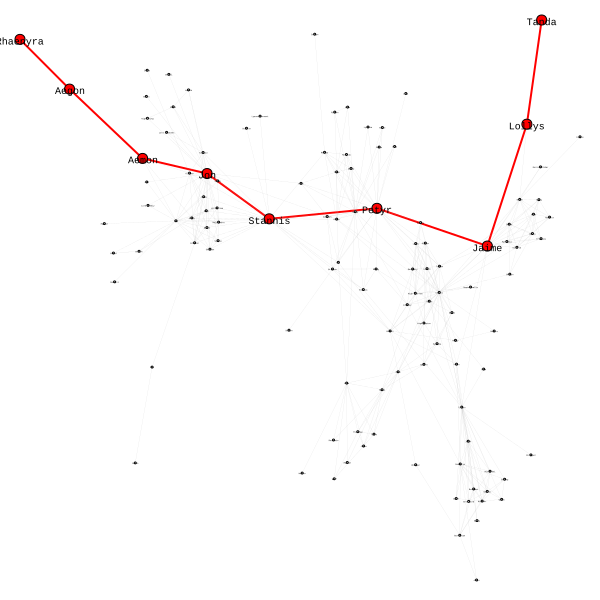

In [18]:
import networkx as nx
import igraph as ig

# Calculate the diameter path using igraph
d = g.get_diameter()

# GET NODES IN THE DIAMETER PATH
diameter_path = d

# GET EDGES IN THE DIAMETER PATH
diameter_edges = g.get_eids(pairs=[(d[i], d[i+1]) for i in range(len(d)-1)], directed=False)

# Visual style for plotting
visual_style = {
    "vertex_color": ["red" if node.index in diameter_path else "white" for node in g.vs],
    "edge_color": ["red" if edge.index in diameter_edges else "grey" for edge in g.es],
    "edge_width": [2 if edge.index in diameter_edges else 0.1 for edge in g.es],
    "vertex_label": [node["Label"] for node in g.vs],
    "vertex_size": [10 if node.index in diameter_path else 2 for node in g.vs],
    "vertex_label_size": [10 if node.index in diameter_path else 2 for node in g.vs]

}

print("Path between most distant nodes:", [g.vs[index]["Label"] for index in diameter_path])



# Plot the graph
ig.plot(g, **visual_style)


### Shortest Paths

Shortest paths between Daenerys and other nodes [['Daenerys', 'Robert', 'Ned', 'Arya'], ['Daenerys', 'Robert', 'Ned', 'Arya', 'Jaqen'], ['Daenerys', 'Robert', 'Cersei', 'Meryn', 'Jaqen'], ['Daenerys', 'Varys', 'Cersei', 'Meryn', 'Jaqen'], ['Daenerys', 'Tyrion', 'Cersei', 'Meryn', 'Jaqen'], ['Daenerys', 'Jorah', 'Cersei', 'Meryn', 'Jaqen'], ['Daenerys', 'Robert', 'High Sparrow', 'Meryn', 'Jaqen'], ['Daenerys', 'Robert', 'Cersei', 'Mace', 'Jaqen'], ['Daenerys', 'Varys', 'Cersei', 'Mace', 'Jaqen'], ['Daenerys', 'Tyrion', 'Cersei', 'Mace', 'Jaqen'], ['Daenerys', 'Jorah', 'Cersei', 'Mace', 'Jaqen'], ['Daenerys', 'Varys', 'Pycelle', 'Mace', 'Jaqen'], ['Daenerys', 'Jorah'], ['Daenerys', 'Tyrion'], ['Daenerys', 'Tyrion', 'Jaime', 'Bronn'], ['Daenerys', 'Varys', 'Jaime', 'Bronn'], ['Daenerys', 'Jorah', 'Cersei', 'Bronn'], ['Daenerys', 'Tyrion', 'Cersei', 'Bronn'], ['Daenerys', 'Varys', 'Cersei', 'Bronn'], ['Daenerys', 'Robert', 'Cersei', 'Bronn'], ['Daenerys', 'Varys', 'Jaime'], ['Daenerys', 'T

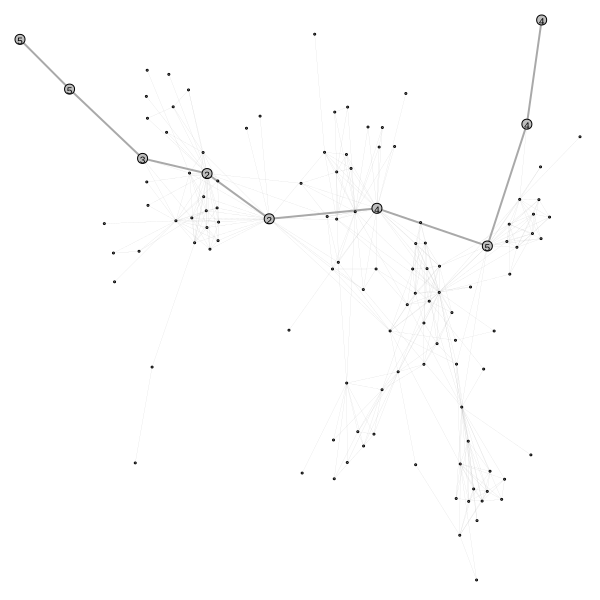

In [19]:
# SHORTEST PATHS
shortest_paths = {}
for node in nodes:
    shortest_paths[node["Label"]]=[nodes[v]["Label"] for v in g.get_all_shortest_paths(node)
                                                    ]
# SHOW DISTANCES OF SHORTEST PATHS BETWEEN ONE NODE AND EVERYBODY ELSE

node_name = "Daenerys"
print("Shortest paths between", node_name,"and other nodes", shortest_paths[node_name])

distances = [len(path) for path in shortest_paths[node_name]]

visual_style["vertex_color"] = ["pink" if node["Label"]==node_name else "grey" for node in nodes]
visual_style["edge_color"] = "darkgrey"

visual_style["vertex_label"] = distances

ig.plot(g, **visual_style)

In [20]:
sp = dict(nx.shortest_path(G)) #between all nodes
print(sp)

{'ARYA': {'ARYA': ['ARYA'], 'JAQEN': ['ARYA', 'JAQEN'], 'WAIF': ['ARYA', 'WAIF'], 'MERYN_TRANT': ['ARYA', 'MERYN_TRANT'], 'THIN_MAN': ['ARYA', 'THIN_MAN'], 'MACE': ['ARYA', 'MACE'], 'NED': ['ARYA', 'NED'], 'TYCHO': ['ARYA', 'TYCHO'], 'MADAME': ['ARYA', 'MADAME'], 'MOUNTAIN': ['ARYA', 'MOUNTAIN'], 'SANSA': ['ARYA', 'SANSA'], 'WALDER': ['ARYA', 'WALDER'], 'CERSEI': ['ARYA', 'MERYN_TRANT', 'CERSEI'], 'QYBURN': ['ARYA', 'MERYN_TRANT', 'QYBURN'], 'HIGH_SPARROW': ['ARYA', 'MERYN_TRANT', 'HIGH_SPARROW'], 'PYCELLE': ['ARYA', 'MACE', 'PYCELLE'], 'HIGH_SEPTON': ['ARYA', 'MACE', 'HIGH_SEPTON'], 'TOMMEN': ['ARYA', 'MACE', 'TOMMEN'], 'STANNIS': ['ARYA', 'NED', 'STANNIS'], 'LITTLEFINGER': ['ARYA', 'NED', 'LITTLEFINGER'], 'ROBERT': ['ARYA', 'NED', 'ROBERT'], 'CATELYN': ['ARYA', 'NED', 'CATELYN'], 'THEON': ['ARYA', 'NED', 'THEON'], 'MYRANDA': ['ARYA', 'SANSA', 'MYRANDA'], 'RAMSAY': ['ARYA', 'SANSA', 'RAMSAY'], 'ROOSE_BOLTON': ['ARYA', 'SANSA', 'ROOSE_BOLTON'], 'BRIENNE': ['ARYA', 'SANSA', 'BRIENNE'], 

<class 'networkx.utils.decorators.argmap'> compilation 58:3: FutureWarning: 

shortest_path will return an iterator that yields
(node, path) pairs instead of a dictionary when source
and target are unspecified beginning in version 3.5

To keep the current behavior, use:

	dict(nx.shortest_path(G))


In [21]:
i = 0
for _, v in sp.items():
  for char, dic in v.items():
    if len(dic) == len(diameter_path):
      i = i+1

print("The number of the shortest path long as the diameter are", i)

The number of the shortest path long as the diameter are 2


In [22]:
# AVERAGE SHORTEST PATH LENGTH - HOW CLOSE ARE THE NODES TO EACH OTHER ON AVERAGE

if nx.is_connected(G):
    avg_shortest_path = nx.average_shortest_path_length(G)
else:
    # Extract the largest connected component
    largest_cc = max(nx.connected_components(G), key=len)
    subgraph = G.subgraph(largest_cc)
    avg_shortest_path = nx.average_shortest_path_length(subgraph)

print("Average shortest path length:", avg_shortest_path)

Average shortest path length: 3.216137911053165


### Node Degrees

In [23]:
# CONNECTIVITY - HOW WELL CONNECTED A NODE IS

def sum_neigh_degree(graph): # compute the sum of neighbors' degrees
    data = {}
    for node in graph.vs:
        neighbors = graph.neighbors(node, mode="all")
        neighbors_degrees = [graph.degree(neigh) for neigh in neighbors]
        data[node.index] = sum(neighbors_degrees) / len(neighbors_degrees) if neighbors_degrees else 0
    return data


print("Node degrees:"),

# Compute the average degree of each node’s neighbors
sum_neigh_degree = sum_neigh_degree(g)


degree = [v.degree() for v in g.vs]
average_neigh_degree = [sum_neigh_degree[v.index] for v in g.vs]

degree_df = pd.DataFrame({
    'Node': g.vs["Label"],
    'Degree': degree,
    "Average degree of node's neighbours": average_neigh_degree
})

degree_df = degree_df.sort_values(by=['Degree'], ascending=False)

# Print results
print("First 10 nodes with highest degree")
print(degree_df.head(10))
print("\n")
print("Last 5 nodes with lowest degree")
print(degree_df.tail(5))



Node degrees:
First 10 nodes with highest degree
        Node  Degree  Average degree of node's neighbours
8     Cersei      30                             9.633333
12       Jon      25                             7.440000
14     Petyr      25                             8.880000
13   Stannis      24                            10.375000
15     Sansa      21                             8.809524
16       Sam      20                             8.100000
3     Tyrion      19                             8.526316
5      Jaime      17                            10.882353
7   Daenerys      14                             8.000000
20    Tommen      12                            12.750000


Last 5 nodes with lowest degree
         Node  Degree  Average degree of node's neighbours
106    Walder       1                                 11.0
104     Denys       1                                 11.0
103  Rhaenyra       1                                  2.0
97     Othell       1                      

In [24]:
dmax = max(degree_df['Degree'])
print(f'maximum degree: {dmax}')
dmin = min(degree_df['Degree'])
print(f'minimum degree: {dmin}')
davg = np.mean(degree_df['Degree'])
print(f'average degree: {davg}')
dmostfreq = list(dict(degree_df['Degree'].value_counts()).items())[0]
print(f'most frequent degree (mode): {dmostfreq[0]} with {dmostfreq[1]} nodes')

maximum degree: 30
minimum degree: 1
average degree: 6.694915254237288
most frequent degree (mode): 2 with 18 nodes


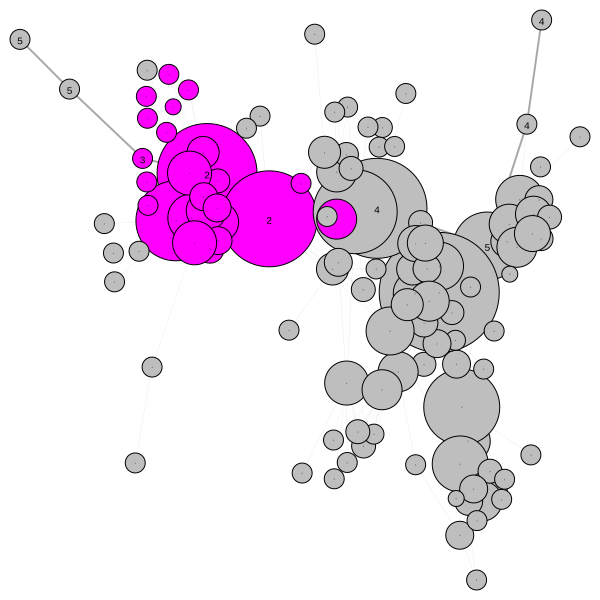

In [25]:
#SET SIZE PROP TO DEGREE
visual_style["vertex_size"] = [4*degree if degree>3 else 20 for degree in g.degree()]

#COLOR NEAREST NEIGHBORS OF A CERTAIN NODE
node_name = "Jon"
for node in nodes:
    if node["Label"] == node_name:
        node_index = node.index

neighbors = g.neighborhood(nodes[node_index],order=1)
visual_style["vertex_color"] = ["fuchsia" if node.index in neighbors else "grey" for node in nodes]
visual_style["edge_color"] = "darkgrey"

ig.plot(g, **visual_style)

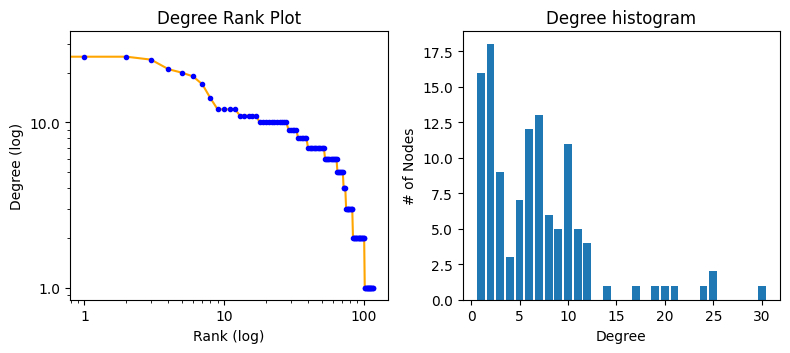

In [26]:
from matplotlib.ticker import ScalarFormatter


fig = plt.figure("Degree ", figsize=(8, 8))

axgrid = fig.add_gridspec(5, 4)

ax0 = fig.add_subplot(axgrid[3:, :2])
# Plot the line in orange
ax0.plot(sorted(degree_df['Degree'], reverse=True), "orange")
# Plot the dots in blue
ax0.plot(sorted(degree_df['Degree'], reverse=True), "bo", markersize=3)
ax0.set_title("Degree Rank Plot")
ax0.set_ylabel("Degree (log)")
ax0.set_xlabel("Rank (log)")
ax0.set_xscale('log')
ax0.set_yscale('log')

ax0.xaxis.set_major_formatter(ScalarFormatter())
ax0.yaxis.set_major_formatter(ScalarFormatter())

ax1 = fig.add_subplot(axgrid[3:, 2:])
unique, counts = np.unique(degree_df['Degree'], return_counts=True)
ax1.bar(unique, counts)
ax1.set_title("Degree histogram")
ax1.set_xlabel("Degree")
ax1.set_ylabel("# of Nodes")

fig.tight_layout()
plt.show()


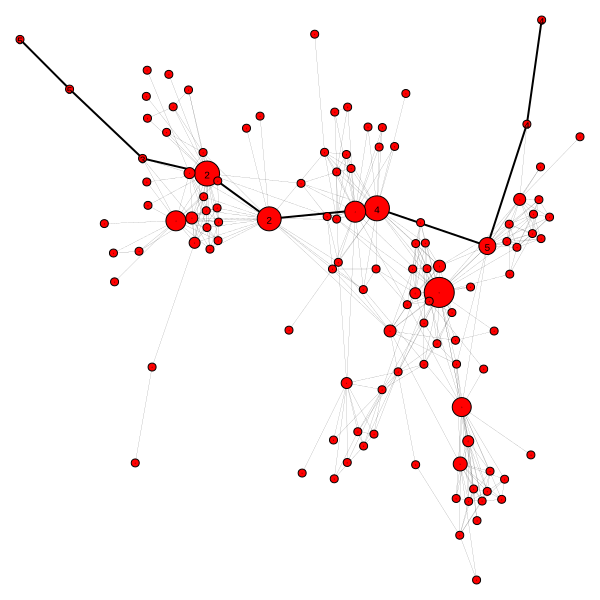

In [27]:
visual_style["vertex_size"] = [degree if degree>10 else 8 for degree in g.degree()]
visual_style['edge_color'] = 'black'
visual_style['vertex_color'] = 'red'
ig.plot(g, **visual_style)

### Bridges

An edge is a bridge if its removal increases the number of (weakly) connected components in the graph.

In [28]:
bridges = g.bridges()

if bridges:
    print("The network has bridges.")
    bridge_labels = [(g.vs[g.es[bridge].source]["Label"], g.vs[g.es[bridge].target]["Label"]) for bridge in bridges]
    print("The bridges are:", bridge_labels)
else:
    print("The network doesn't have any bridges")

print("Number of bridges:", len(bridges))

The network has bridges.
The bridges are: [('Arya', 'Walder'), ('Tyrion', 'Strumpet'), ('Bronn', 'Falyse'), ('Brienne', 'Selwyn'), ('Jon', 'Othell'), ('Jon', 'Brian'), ('Stannis', 'Lyanna Mormont'), ('Stannis', 'Steffon'), ('Petyr', 'Lysa'), ('Sam', 'Magnar'), ('Sam', 'Randyll'), ('Ramsay', 'Cerwyn'), ('Alliser', 'Denys'), ('Aemon', 'Aegon'), ('Lollys', 'Tanda'), ('Eddison', 'Pyp'), ('Aegon', 'Rhaenyra'), ('Pyp', 'Grenn')]
Number of bridges: 18


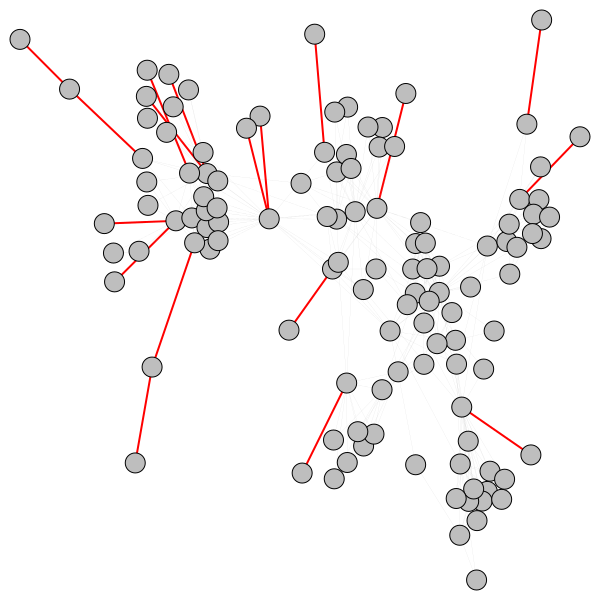

In [29]:
visual_style = {}

bridges_index = g.bridges()

visual_style["vertex_color"] = 'grey'
visual_style["edge_color"] = ["red" if edge.index in bridges_index else "grey" for edge in edges]
#visual_style["vertex_label"] = [g.vs[edge.source]["Label"] for edge in edges]
visual_style["edge_width"] = [2 if edge.index in bridges_index else 0.1 for edge in edges]
#visual_style["vertex_label_size"] = [10 if edge.index in bridges_index else 2 for edge in edges]

ig.plot(g, **visual_style)

### Giant Components



In [30]:
clusters = g.connected_components()
clusters = sorted(clusters, key=len, reverse=True)

# Get the largest connected component
largest_cc = clusters[0]
G0 = g.subgraph(largest_cc)

# Check if the original graph is isomorphic to the largest connected component
if g.isomorphic(G0):
    print("This network is connected and there are no isolated nodes")
else:
    print("This network has", len(clusters), "components")

This network is connected and there are no isolated nodes


### Centrality

### Homophily

In [31]:
# Degree Centrality
degree_cen = nx.degree_centrality(G)

# Weighted degree centrality
weighted_degree_cen = {node: sum(weight for _, _, weight in G.edges(node, data='Weight')) for node in G.nodes()}
# Normalize the weighted degree centrality
max_weighted_degree = max(weighted_degree_cen.values())
weighted_degree_cen = {node: centrality / max_weighted_degree for node, centrality in weighted_degree_cen.items()}

clo_cen = nx.closeness_centrality(G)
bet_cen = nx.betweenness_centrality(G)
eig_cen = nx.eigenvector_centrality(G)
har_cen = nx.harmonic_centrality(G)
pagerank_cen = nx.pagerank(G)

centrality_df = pd.DataFrame(data={
    'Node': list(bet_cen.keys()),
    'Betweenness centrality': list(bet_cen.values()),
    'Closeness centrality': list(clo_cen.values()),
    'Eigenvector centrality': list(eig_cen.values()),
    'Harmonic centrality': [1/x for x in har_cen.values()],
    'Degree centrality': list(degree_cen.values()),
    'Weighted degree centrality': list(weighted_degree_cen.values()),
    'PageRank centrality': list(pagerank_cen.values())
})

centrality_df



,Node,Betweenness centrality,Closeness centrality,Eigenvector centrality,Harmonic centrality,Degree centrality,Weighted degree centrality,PageRank centrality
0,ARYA,0.073530,0.335244,0.044897,0.017549,0.094017,0.411864,0.015412
1,JAQEN,0.001954,0.282609,0.018642,0.021307,0.051282,0.333898,0.008268
2,JORAH,0.023781,0.340116,0.062485,0.019973,0.094017,0.413559,0.012413
3,TYRION,0.127249,0.388704,0.104295,0.027137,0.162393,0.813559,0.021629
4,BRONN,0.031413,0.335244,0.070429,0.018874,0.102564,0.401695,0.014740
...,...,...,...,...,...,...,...,...
113,TANDA,0.000000,0.225869,0.001685,0.026655,0.008547,0.003390,0.002884
114,LYANNA_MORMONT,0.000000,0.312000,0.029039,0.022997,0.008547,0.003390,0.002278
115,MAGNAR,0.000000,0.259424,0.021471,0.021209,0.008547,0.003390,0.002399
116,RANDYLL,0.000000,0.259424,0.021471,0.029240,0.008547,0.003390,0.002399


In [32]:
print("Mean values of Centralities:")
print("Betweenness:", np.mean(list(bet_cen.values())))
print("Closeness:", np.mean(list(clo_cen.values())))
print("Eigenvector:", np.mean(list(eig_cen.values())))
print("Harmonic:", 1/np.mean(list(har_cen.values())))
print("Degree:", np.mean(list(degree_cen.values())))
print("Weighted Degree:", np.mean(list(weighted_degree_cen.values())))
print("PageRank:", np.mean(list(pagerank_cen.values())))

Mean values of Centralities:
Betweenness: 0.019104637164251422
Closeness: 0.31922815250735487
Eigenvector: 0.06818936477940428
Harmonic: 0.023229533192312503
Degree: 0.057221497899464006
Weighted Degree: 0.1476587187589773
PageRank: 0.008474576271186439


In [33]:
def highest_centrality(centrality_dict):
    # Sort items by centrality score in descending order and return the top one
    cent_items = sorted(centrality_dict.items(), key=lambda item: item[1], reverse=True)
    return cent_items[0]

def k_highest_centrality(centrality_dict, k):
    # Sort items by centrality score in descending order and return the top k
    cent_items = sorted(centrality_dict.items(), key=lambda item: item[1], reverse=True)
    return cent_items[:k]

In [34]:
highest_centrality_clo_cen = k_highest_centrality(clo_cen, 5)
clo_cen_char, clo_cen_scores = zip(*highest_centrality_clo_cen)

highest_centrality_bet_cen = k_highest_centrality(bet_cen, 5)
bet_cen_char, bet_cen_scores = zip(*highest_centrality_bet_cen)

highest_centrality_eig_cen = k_highest_centrality(eig_cen, 5)
eig_cen_char, eig_cen_scores = zip(*highest_centrality_eig_cen)

highest_centrality_har_cen = k_highest_centrality(har_cen, 5)
har_cen_char, har_cen_scores = zip(*highest_centrality_har_cen)

highest_centrality_degree_cen = k_highest_centrality(degree_cen, 5)
degree_cen_char, degree_cen_scores = zip(*highest_centrality_degree_cen)

highest_centrality_weighted_degree_cen = k_highest_centrality(weighted_degree_cen, 5)
weighted_degree_cen_char, weighted_degree_cen_scores = zip(*highest_centrality_weighted_degree_cen)

highest_centrality_pagerank_cen = k_highest_centrality(pagerank_cen, 5)
pagerank_cen_char, pagerank_cen_scores = zip(*highest_centrality_pagerank_cen)

# Update the DataFrame to display the top 5 most central nodes for each measure correctly
centrality_df = pd.DataFrame(data={
    'Most central character - Betweenness': bet_cen_char,
    'Score - Betweenness': bet_cen_scores,
    'Most central character - Closeness': clo_cen_char,
    'Score - Closeness': clo_cen_scores,
    'Most central character - Eigenvector': eig_cen_char,
    'Score - Eigenvector': eig_cen_scores,
    'Most central character - Harmonic': har_cen_char,
    'Score - Harmonic': [1/x for x in har_cen_scores],
    'Most central character - Degree': degree_cen_char,
    'Score - Degree': degree_cen_scores,
    'Most central character - Weighted Degree': weighted_degree_cen_char,
    'Score - Weighted Degree': weighted_degree_cen_scores,
    'Most central character - PageRank': pagerank_cen_char,
    'Score - PageRank': pagerank_cen_scores
})


centrality_df

,Most central character - Betweenness,Score - Betweenness,Most central character - Closeness,Score - Closeness,Most central character - Eigenvector,Score - Eigenvector,Most central character - Harmonic,Score - Harmonic,Most central character - Degree,Score - Degree,Most central character - Weighted Degree,Score - Weighted Degree,Most central character - PageRank,Score - PageRank
0,STANNIS,0.327385,CERSEI,0.458824,STANNIS,0.317706,CERSEI,0.015155,CERSEI,0.256410,CERSEI,1.000000,JON,0.032608
1,CERSEI,0.266078,LITTLEFINGER,0.455253,JON,0.270486,LITTLEFINGER,0.015740,JON,0.213675,JON,0.935593,CERSEI,0.031556
2,LITTLEFINGER,0.190947,STANNIS,0.451737,CERSEI,0.240840,STANNIS,0.015979,LITTLEFINGER,0.213675,TYRION,0.813559,LITTLEFINGER,0.028726
3,JON,0.155551,SANSA,0.444867,LITTLEFINGER,0.235377,SANSA,0.016318,STANNIS,0.205128,DAENERYS,0.700000,STANNIS,0.028424
4,SANSA,0.130677,ROOSE_BOLTON,0.433333,SAM,0.234916,JAIME,0.017549,SANSA,0.179487,STANNIS,0.661017,SAM,0.026531


In [35]:
#Compute degree assortativity of graph.
#Assortativity measures the similarity of connections in the graph with respect to the node degree.
#This is the same as degree_assortativity_coefficient but uses the potentially faster scipy.stats.pearsonr function.
assortativity_coefficient = nx.degree_assortativity_coefficient(G, weight="Weight")
print("Degree assortativity coefficient:",nx.degree_pearson_correlation_coefficient(G,weight="Weight"))

Degree assortativity coefficient: -0.1985276338060207


In [36]:
#jaccard similarity between all couples of nodes
preds = nx.jaccard_coefficient(G, G.edges())

first_node = []
sec_node = []
score = []

for u, v, p in preds:
  first_node.append(u)
  sec_node.append(v)
  score.append(p)

jaccard_coefficient = pd.DataFrame(data = list(zip(first_node, sec_node, score)),
                             columns = ['First node', 'Second node', 'Score'])

jaccard_coefficient = jaccard_coefficient.sort_values("Score", ascending=False)
jaccard_coefficient

,First node,Second node,Score
307,SHIREEN,SELYSE,0.750000
294,MYRANDA,WALDA,0.714286
12,JAQEN,THIN_MAN,0.714286
242,DAARIO,HIZDAHR,0.666667
392,QUICK,STRONG,0.666667
...,...,...,...
129,BRIENNE,SELWYN,0.000000
118,HIGH_SPARROW,RENLY,0.000000
56,BRONN,FALYSE,0.000000
370,MAESTER_AEMON,AEGON,0.000000


### Triangles

In [37]:
#list of all traingles
triangles_list = [(n,nbr,nbr2) for n in G for nbr, nbr2 in itertools.combinations(G[n],2) if nbr in G[nbr2]]
print("List of all the edges involved in the traingles")
triangles_list[:30]

List of all the edges involved in the traingles


[('ARYA', 'JAQEN', 'WAIF'),
 ('ARYA', 'JAQEN', 'MERYN_TRANT'),
 ('ARYA', 'JAQEN', 'THIN_MAN'),
 ('ARYA', 'JAQEN', 'MACE'),
 ('ARYA', 'JAQEN', 'TYCHO'),
 ('ARYA', 'WAIF', 'THIN_MAN'),
 ('ARYA', 'MERYN_TRANT', 'THIN_MAN'),
 ('ARYA', 'MERYN_TRANT', 'MACE'),
 ('ARYA', 'MERYN_TRANT', 'TYCHO'),
 ('ARYA', 'MERYN_TRANT', 'MADAME'),
 ('ARYA', 'MERYN_TRANT', 'MOUNTAIN'),
 ('ARYA', 'THIN_MAN', 'MACE'),
 ('ARYA', 'THIN_MAN', 'TYCHO'),
 ('ARYA', 'MACE', 'TYCHO'),
 ('ARYA', 'NED', 'SANSA'),
 ('JAQEN', 'ARYA', 'WAIF'),
 ('JAQEN', 'ARYA', 'THIN_MAN'),
 ('JAQEN', 'ARYA', 'MACE'),
 ('JAQEN', 'ARYA', 'MERYN_TRANT'),
 ('JAQEN', 'ARYA', 'TYCHO'),
 ('JAQEN', 'WAIF', 'THIN_MAN'),
 ('JAQEN', 'THIN_MAN', 'MACE'),
 ('JAQEN', 'THIN_MAN', 'MERYN_TRANT'),
 ('JAQEN', 'THIN_MAN', 'TYCHO'),
 ('JAQEN', 'MACE', 'MERYN_TRANT'),
 ('JAQEN', 'MACE', 'TYCHO'),
 ('JAQEN', 'MERYN_TRANT', 'TYCHO'),
 ('JORAH', 'TYRION', 'DAENERYS'),
 ('JORAH', 'TYRION', 'DAARIO'),
 ('JORAH', 'TYRION', 'MALKO')]

In [38]:
#number of triangles per character, sorted by value in descendent order

triangles_frequency = pd.DataFrame(data = list(zip(nx.triangles(G).keys(), nx.triangles(G).values())),
                             columns = ['Character', '# of triangles in which they are involved'])

triangles_frequency = triangles_frequency.sort_values("# of triangles in which they are involved", ascending=False)
triangles_frequency.head(10)

,Character,# of triangles in which they are involved
8,CERSEI,75
13,STANNIS,71
12,JON,66
16,SAM,58
14,LITTLEFINGER,55
15,SANSA,44
5,JAIME,44
3,TYRION,41
7,DAENERYS,37
17,GILLY,37


In [39]:
#total number of triangles
print("There are", int(np.sum(list(nx.triangles(G).values())) / 3), "triangles")

There are 554 triangles


Investigating interesting character triangles

In [40]:
community_graph_layout_gn = nx.spring_layout(G)


default_node_color = "lightgrey"
default_edge_color = "grey"


node_colors = [default_node_color] * len(G.nodes())
node_sizes = [70] * len(G.nodes())


edge_colors = [default_edge_color] * len(G.edges())
edge_widths = [1] * len(G.edges())


edges_set = set(map(frozenset, G.edges()))

# Function to compute the strength of a triangle and the maximum edge weight
def compute_triangle_strength_and_max_edge(triangle, graph):
    nodes = list(triangle)
    strength = 0
    max_edge_weight = 0
    max_edge = None
    for i in range(3):
        for j in range(i + 1, 3):
            edge = (nodes[i], nodes[j]) if (nodes[i], nodes[j]) in graph.edges() else (nodes[j], nodes[i])
            if edge in graph.edges():
                edge_weight = graph[edge[0]][edge[1]]['Weight']
                strength += edge_weight
                if edge_weight > max_edge_weight:
                    max_edge_weight = edge_weight
                    max_edge = edge
    return strength, max_edge_weight, max_edge

# Find all triangles in the graph
triangles = [list(triangle) for triangle in nx.enumerate_all_cliques(G) if len(triangle) == 3]

# Compute the strengths and max edge weights of all triangles
triangle_strengths_and_max_edges = []
for triangle in triangles:
    strength, max_edge_weight, max_edge = compute_triangle_strength_and_max_edge(triangle, G)
    triangle_strengths_and_max_edges.append((triangle, strength, max_edge_weight, max_edge))

# Sort triangles by strength in descending order and select the top 10
top_triangles = sorted(triangle_strengths_and_max_edges, key=lambda x: x[1], reverse=True)[:70]

# Highlight the nodes and edges in the top 10 triangles
for triangle, strength, max_edge_weight, max_edge in top_triangles:
    color = "Crimson"  # Use a single color for all top triangles or set a different color if needed
    for node in triangle:
        if node in G.nodes():
            node_index = list(G.nodes()).index(node)
            node_colors[node_index] = color  # Node color based on triangle color
            node_sizes[node_index] = 100  # Larger size for highlighted nodes

    for i in range(3):
        for j in range(i + 1, 3):
            edge = (triangle[i], triangle[j]) if (triangle[i], triangle[j]) in G.edges() else (triangle[j], triangle[i])
            if edge in G.edges():
                edge_index = list(G.edges()).index(edge)
                edge_colors[edge_index] = color  # Edge color based on triangle color
                edge_widths[edge_index] = 5  # Thicker edge for edges in triangles


for triangle, strength, max_edge_weight, max_edge in top_triangles:
    print(f"Triangle {triangle} has strength {strength}, the highest edge strength is {max_edge_weight}, and the strongest edge is {max_edge}")


positions = community_graph_layout_gn
g.vs["x"] = [positions[node][0] for node in G.nodes()]
g.vs["y"] = [positions[node][1] for node in G.nodes()]

fig, ax = plt.subplots(figsize=(45, 45))
ax.set_xlim(min(g.vs["x"]) - 0.05, max(g.vs["x"]) + 0.05)
ax.set_ylim(min(g.vs["y"]) - 0.05, max(g.vs["y"]) + 0.05)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in positions.values()],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"],
    vertex_label_size=30,
    edge_color=edge_colors,
    edge_width=edge_widths
)

plt.show()


Output hidden; open in https://colab.research.google.com to view.

In [41]:
import networkx as nx
import matplotlib.pyplot as plt
import igraph as ig

# Define the highlighted triangles with colors
highlighted_triangles = [
    (('TYRION', 'DAENERYS', 'DAARIO'), "Orange"),
    (('JORAH', 'TYRION', 'DAENERYS'), "MistyRose"),
    (('JORAH', 'TYRION', 'VARYS'), "Red"),
    (('ARYA', 'JAQEN', 'WAIF'), "Yellow"),
    (('CERSEI', 'MARGAERY', 'TOMMEN'), "LimeGreen"),
    (('JON', 'SAM', 'OLLY'), "HotPink"),
    (('JON', 'STANNIS', 'SAM'), "DarkRed"),
    (('STANNIS', 'DAVOS', 'SHIREEN'), "LightBlue")
]


community_graph_layout_gn = nx.spring_layout(G)


default_node_color = "lightgrey"
default_edge_color = "grey"


node_colors = [default_node_color] * len(G.nodes())
node_sizes = [70] * len(G.nodes())


edge_colors = [default_edge_color] * len(G.edges())
edge_widths = [1] * len(G.edges())


edges_set = set(map(frozenset, G.edges()))

# Function to compute the strength of a triangle and the maximum edge weight
def compute_triangle_strength_and_max_edge(triangle, graph):
    nodes = list(triangle)
    strength = 0
    max_edge_weight = 0
    max_edge = None
    for i in range(3):
        for j in range(i + 1, 3):
            edge = (nodes[i], nodes[j]) if (nodes[i], nodes[j]) in graph.edges() else (nodes[j], nodes[i])
            if edge in graph.edges():
                edge_weight = graph[edge[0]][edge[1]]['Weight']
                strength += edge_weight
                if edge_weight > max_edge_weight:
                    max_edge_weight = edge_weight
                    max_edge = edge
    return strength, max_edge_weight, max_edge

# Highlight the nodes and edges in the triangles and compute strengths and max edge weights
triangle_strengths_and_max_edges = []
for idx, (triangle, color) in enumerate(highlighted_triangles):
    strength, max_edge_weight, max_edge = compute_triangle_strength_and_max_edge(triangle, G)
    triangle_strengths_and_max_edges.append((triangle, strength, max_edge_weight, max_edge))

    for node in triangle:
        if node in G.nodes():
            node_index = list(G.nodes()).index(node)
            node_colors[node_index] = color  # Node color based on triangle color
            node_sizes[node_index] = 100  # Larger size for highlighted nodes

    for i in range(3):
        for j in range(i + 1, 3):
            edge = (triangle[i], triangle[j]) if (triangle[i], triangle[j]) in G.edges() else (triangle[j], triangle[i])
            if edge in G.edges():
                edge_index = list(G.edges()).index(edge)
                edge_colors[edge_index] = color  # Edge color based on triangle color
                edge_widths[edge_index] = 5  # Thicker edge for edges in triangles


for triangle, strength, max_edge_weight, max_edge in triangle_strengths_and_max_edges:
    print(f"Triangle {triangle} has strength {strength}, the highest edge strength is {max_edge_weight}, and the strongest edge is {max_edge}")


positions = community_graph_layout_gn
g.vs["x"] = [positions[node][0] for node in G.nodes()]
g.vs["y"] = [positions[node][1] for node in G.nodes()]

fig, ax = plt.subplots(figsize=(45, 45))
ax.set_xlim(min(g.vs["x"]) - 0.05, max(g.vs["x"]) + 0.05)
ax.set_ylim(min(g.vs["y"]) - 0.05, max(g.vs["y"]) + 0.05)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in positions.values()],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"],
    vertex_label_size=30,
    edge_color=edge_colors,
    edge_width=edge_widths
)

plt.show()


Output hidden; open in https://colab.research.google.com to view.

Specifically about a character

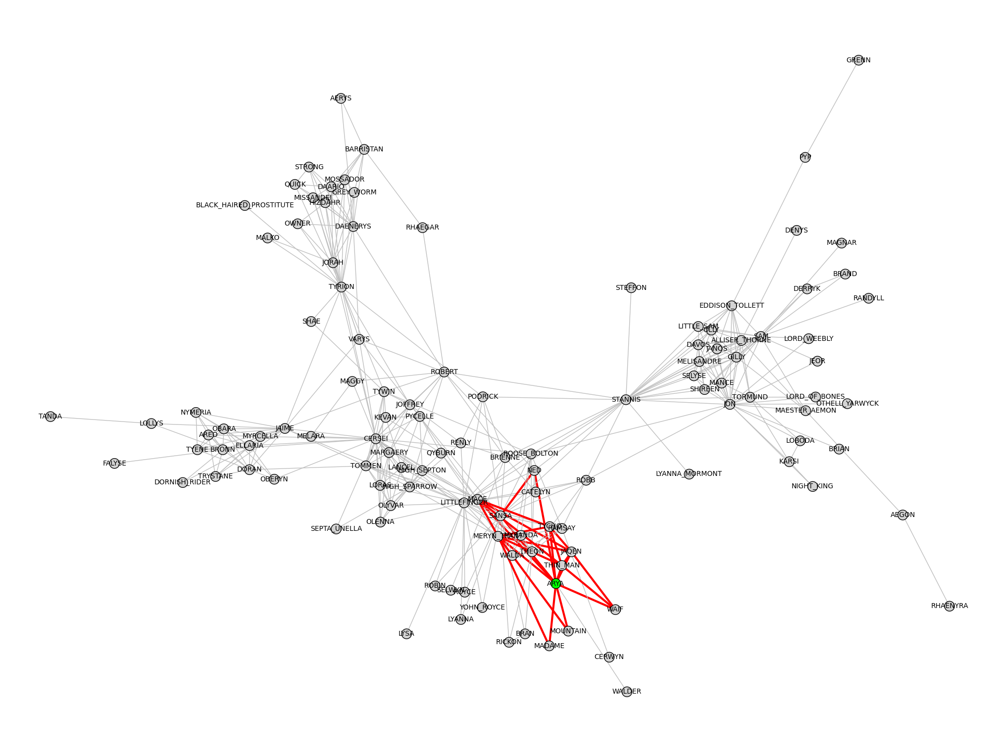

In [42]:
highlight_node = "ARYA"

def find_triangles_with_node(G, node):
    triangles = []
    for n in G:
        neighbors = list(G.neighbors(n))
        for nbr, nbr2 in itertools.combinations(neighbors, 2):
            if G.has_edge(nbr, nbr2) and node in (n, nbr, nbr2):
                triangles.append((n, nbr, nbr2))
    return triangles

community_graph_layout_gn = nx.spring_layout(G)


node_colors = []
edge_colors = []
for node in G.nodes():
    if node == highlight_node:
        node_colors.append("green")
    else:
        node_colors.append("lightgrey")


edge_colors = ["grey"] * len(G.edges())
edge_widths = [1] * len(G.edges())


highlighted_triangles = find_triangles_with_node(G, highlight_node)


for triangle in highlighted_triangles:
    triangle_edges = [
        (triangle[0], triangle[1]),
        (triangle[1], triangle[2]),
        (triangle[2], triangle[0])
    ]
    for edge in triangle_edges:
        try:
            if edge in G.edges():
                edge_index = list(G.edges()).index(edge)
            elif (edge[1], edge[0]) in G.edges():
                edge_index = list(G.edges()).index((edge[1], edge[0]))
            else:
                continue  # Skip if edge not found in G.edges()

            edge_colors[edge_index] = "red"  # Color edges in triangles with red
            edge_widths[edge_index] = 3  # Thicker width for edges in triangles
        except ValueError:
            pass  # Ignore ValueError if edge not found in G.edges()


g = ig.Graph(directed=False)
g.add_vertices(list(G.nodes()))
g.add_edges(list(G.edges()))
g.vs["x"] = [community_graph_layout_gn[node][0] for node in G.nodes()]
g.vs["y"] = [community_graph_layout_gn[node][1] for node in G.nodes()]
g.vs["Label"] = list(G.nodes())

node_sizes = [20] * len(G.nodes())


fig, ax = plt.subplots(figsize=(20, 15))
ax.set_xlim(min(g.vs["x"]) - 0.1, max(g.vs["x"]) + 0.1)
ax.set_ylim(min(g.vs["y"]) - 0.1, max(g.vs["y"]) + 0.1)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)


ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in zip(g.vs["x"], g.vs["y"])],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"],
    vertex_label_size=10,
    edge_color=edge_colors,
    edge_width=edge_widths
)

plt.show()

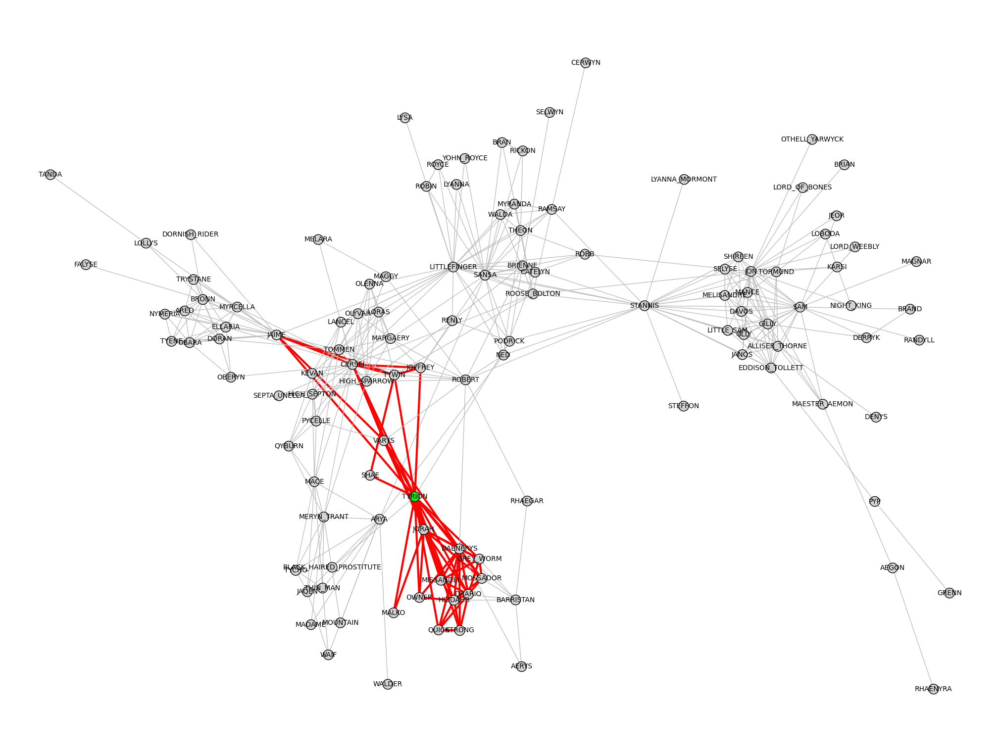

In [43]:
highlight_node = "TYRION"

def find_triangles_with_node(G, node):
    triangles = []
    for n in G:
        neighbors = list(G.neighbors(n))
        for nbr, nbr2 in itertools.combinations(neighbors, 2):
            if G.has_edge(nbr, nbr2) and node in (n, nbr, nbr2):
                triangles.append((n, nbr, nbr2))
    return triangles

community_graph_layout_gn = nx.spring_layout(G)

node_colors = []
edge_colors = []
for node in G.nodes():
    if node == highlight_node:
        node_colors.append("green")  # Highlight TYRION node
    else:
        node_colors.append("lightgrey")


edge_colors = ["grey"] * len(G.edges())
edge_widths = [1] * len(G.edges())


highlighted_triangles = find_triangles_with_node(G, highlight_node)


for triangle in highlighted_triangles:
    triangle_edges = [
        (triangle[0], triangle[1]),
        (triangle[1], triangle[2]),
        (triangle[2], triangle[0])
    ]
    for edge in triangle_edges:
        try:
            if edge in G.edges():
                edge_index = list(G.edges()).index(edge)
            elif (edge[1], edge[0]) in G.edges():
                edge_index = list(G.edges()).index((edge[1], edge[0]))
            else:
                continue  # Skip if edge not found in G.edges()

            edge_colors[edge_index] = "red"  # Color edges in triangles with red
            edge_widths[edge_index] = 3  # Thicker width for edges in triangles
        except ValueError:
            pass  # Ignore ValueError if edge not found in G.edges()


g = ig.Graph(directed=False)
g.add_vertices(list(G.nodes()))
g.add_edges(list(G.edges()))
g.vs["x"] = [community_graph_layout_gn[node][0] for node in G.nodes()]
g.vs["y"] = [community_graph_layout_gn[node][1] for node in G.nodes()]
g.vs["Label"] = list(G.nodes())

node_sizes = [20] * len(G.nodes())


fig, ax = plt.subplots(figsize=(20, 15))
ax.set_xlim(min(g.vs["x"]) - 0.1, max(g.vs["x"]) + 0.1)
ax.set_ylim(min(g.vs["y"]) - 0.1, max(g.vs["y"]) + 0.1)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)


ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in zip(g.vs["x"], g.vs["y"])],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"],
    vertex_label_size=10,
    edge_color=edge_colors,
    edge_width=edge_widths
)

plt.show()

### Clustering Coefficients

GENERAL INDICATION OF THE GRAPH'S TENDENCY TO BE ORGANISED INTO CLUSTERS

If a node has fewer than 2 neighbors, the clustering coefficient is undefined, and the returned value is NaN

In [44]:
# Global Clustering Coefficient (Triadic Closure) - NUMBER OF CLOSED TRIPLETS/NUMBER OF POSSIBLE TRIPLETS

print("Global clustering coefficient (Triadic Closure)", g.transitivity_undirected())

Global clustering coefficient (Triadic Closure) 0.40765268579838115


In [45]:
# Local Clustering Coefficient - ARE THE NEIGHBOURS OF THE NODES ALSO CONNECTED?
print("Local clustering components:")
local_ccs = g.transitivity_local_undirected()
sum_cc = 0
for local_cc in local_ccs:
    if not math.isnan(local_cc):
        sum_cc += local_cc

for node in nodes:
        print("   Local clustering coefficient of node", node["Label"],":",local_ccs[node.index])

Local clustering components:
   Local clustering coefficient of node Arya : 0.2727272727272727
   Local clustering coefficient of node Jaqen : 0.8
   Local clustering coefficient of node Jorah : 0.4909090909090909
   Local clustering coefficient of node Tyrion : 0.23976608187134504
   Local clustering coefficient of node Bronn : 0.3939393939393939
   Local clustering coefficient of node Jaime : 0.3235294117647059
   Local clustering coefficient of node Varys : 0.4761904761904762
   Local clustering coefficient of node Daenerys : 0.4065934065934066
   Local clustering coefficient of node Cersei : 0.1724137931034483
   Local clustering coefficient of node High Sparrow : 0.36363636363636365
   Local clustering coefficient of node Brienne : 0.39285714285714285
   Local clustering coefficient of node Podrick : 0.5333333333333333
   Local clustering coefficient of node Jon : 0.22
   Local clustering coefficient of node Stannis : 0.25724637681159424
   Local clustering coefficient of node Pet

In [46]:
# Average Clustering Coefficient of the graph:

print("Average clustering component", sum_cc/len(g.vs()))


Average clustering component 0.5800247618317703


## Communities

In [47]:
# Checking Strength of Connections between characters for quick and handy insights.

def get_edge_strength(G, node1, node2):
    # Check if the edge exists
    if G.has_edge(node1, node2) or G.has_edge(node2, node1):
        # Get the weight of the edge
        edge_weight = G[node1][node2]['Weight']
        # Get the degrees of the nodes
        degree_node1 = G.degree(node1)
        degree_node2 = G.degree(node2)
        # Compute the strength of the edge as the sum of the degrees and the weight
        edge_strength = edge_weight
        return edge_strength
    else:
        return None  # Edge does not exist


node1 = "GENDRY"
node2 = "STANNIS"

edge_strength = get_edge_strength(G, node1, node2)

if edge_strength is not None:
    print(f"The strength of the edge between '{node1}' and '{node2}' is {edge_strength}.")
else:
    print(f"There is no edge between '{node1}' and '{node2}'.")

There is no edge between 'GENDRY' and 'STANNIS'.


### Infomap

In [48]:
infomap = g.community_infomap()

In [49]:
infomap_comm = infomap.membership


clusters = {}


for i, node in enumerate(G.nodes()):
    community = infomap_comm[i]
    if community not in clusters:
        clusters[community] = []
    clusters[community].append(node)


infomap_comm = [clusters[community] for community in sorted(clusters)]

n_comm_infomap = len(infomap_comm)
print("Number of communities detected:", n_comm_infomap)

Number of communities detected: 9


In [50]:
print("List of Characters by Community")
for i, cluster in enumerate(infomap_comm):
    print(f"Cluster {i+1}: {cluster}")

# Cluster 1: The Riverlands
# Cluster 2: King's Landing (Sansa during S4 is in King's Landing and then flees to the Eyrie)
# Cluster 3: Daenerys in Meereen (Cluster 9 is aggregable to Cluster 3)
# Cluster 4: Castle Black and Mole's Town (Jon and Sam) + Dragonstone (Stannis)
# Cluster 5: Winterfell
# Cluster 6: Beyond the Wall
# Cluster 7: The Eyrie
# Clusters 8-10: unrelated, although cluster 9 has 3 characters from Meereen (should be in Cluster 3)

List of Characters by Community
Cluster 1: ['ARYA', 'JAQEN', 'WAIF', 'MACE', 'TYCHO', 'MERYN_TRANT', 'THIN_MAN', 'MADAME', 'MOUNTAIN', 'WALDER']
Cluster 2: ['JORAH', 'TYRION', 'VARYS', 'DAENERYS', 'DAARIO', 'HIZDAHR', 'BARRISTAN', 'GREY_WORM', 'MISSANDEI', 'MOSSADOR', 'BLACK_HAIRED_PROSTITUTE', 'MALKO', 'OWNER', 'QUICK', 'STRONG', 'AERYS', 'RHAEGAR', 'SHAE']
Cluster 3: ['BRONN', 'JAIME', 'MYRCELLA', 'TYENE', 'DORAN', 'ELLARIA', 'AREO', 'TRYSTANE', 'LOLLYS', 'NYMERIA', 'DORNISH_RIDER', 'OBARA', 'OBERYN', 'FALYSE', 'TANDA']
Cluster 4: ['CERSEI', 'HIGH_SPARROW', 'MARGAERY', 'TOMMEN', 'QYBURN', 'OLENNA', 'LORAS', 'KEVAN', 'MAGGY', 'LANCEL', 'PYCELLE', 'OLYVAR', 'SEPTA_UNELLA', 'HIGH_SEPTON', 'MELARA', 'TYWIN', 'ROBERT', 'JOFFREY']
Cluster 5: ['BRIENNE', 'PODRICK', 'RENLY', 'SELWYN']
Cluster 6: ['JON', 'STANNIS', 'SAM', 'GILLY', 'DAVOS', 'TORMUND', 'MELISANDRE', 'SHIREEN', 'OLLY', 'MANCE', 'ALLISER_THORNE', 'KARSI', 'JANOS', 'SELYSE', 'MAESTER_AEMON', 'LOBODA', 'EDDISON_TOLLETT', 'LORD_OF_B

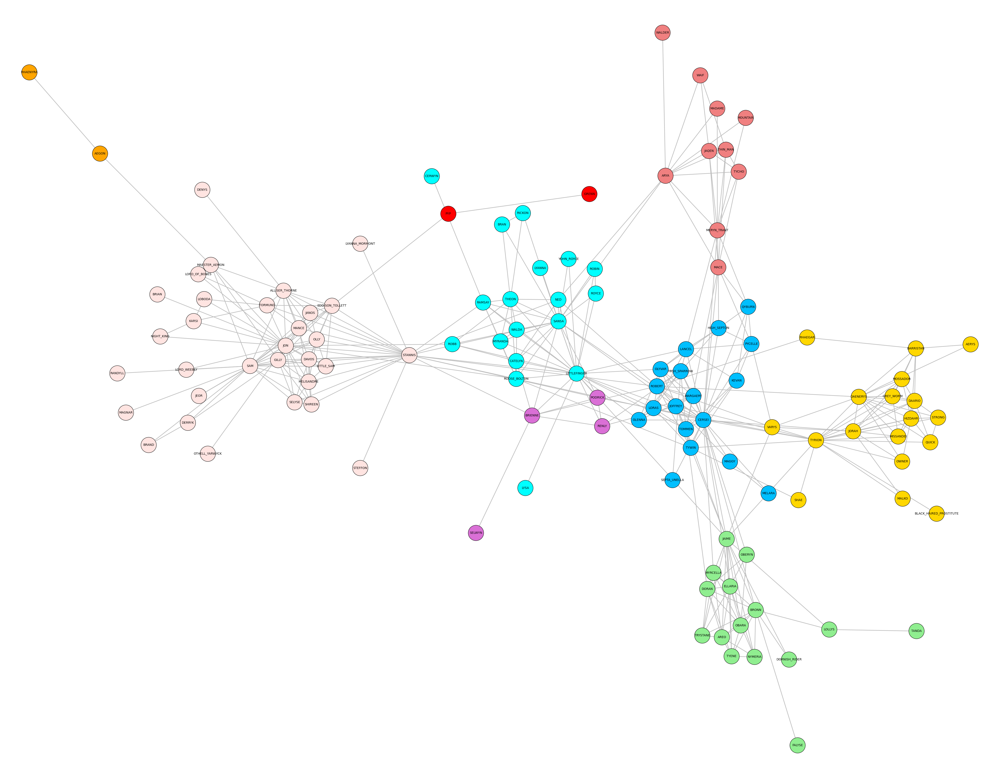

In [51]:
#community_graph_layout_infomap = nx.spring_layout(G, k=2/np.sqrt(len(G.nodes())))
community_graph_layout_infomap = nx.spring_layout(G)

colors = ["LightCoral", "Gold", "LightGreen", "DeepSkyBlue", "Orchid", "MistyRose", "Cyan", "Orange", "Red", "DarkRed", "DarkGreen"]


node_colors = []
node_sizes = []

for node in G.nodes():
    for i, community in enumerate(infomap_comm):
        if node in community:
            node_colors.append(colors[i % len(colors)])
            node_sizes.append(70)
            break


positions = community_graph_layout_infomap
g.vs["x"] = [positions[node][0] for node in G.nodes()]
g.vs["y"] = [positions[node][1] for node in G.nodes()]



fig, ax = plt.subplots(figsize=(45, 35))
ax.set_xlim(min(g.vs["x"])-0.05, max(g.vs["x"])+0.05)
ax.set_ylim(min(g.vs["y"])-0.05, max(g.vs["y"])+0.05)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in positions.values()],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"],
    vertex_label_size = 10,
    edge_color = "grey"

)




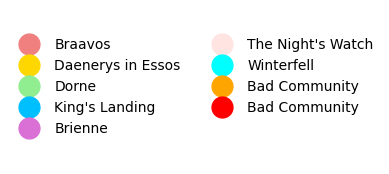

In [52]:
fig_legend, ax_legend = plt.subplots(figsize=(2,2))

# Hardcoding each legend entry
ax_legend.plot([], [], color="LightCoral", marker='o', markersize=15, linestyle='None', label="Braavos")
ax_legend.plot([], [], color="Gold", marker='o', markersize=15, linestyle='None', label="Daenerys in Essos")
ax_legend.plot([], [], color="LightGreen", marker='o', markersize=15, linestyle='None', label="Dorne")
ax_legend.plot([], [], color="DeepSkyBlue", marker='o', markersize=15, linestyle='None', label="King's Landing")
ax_legend.plot([], [], color="Orchid", marker='o', markersize=15, linestyle='None', label="Brienne")
ax_legend.plot([], [], color="MistyRose", marker='o', markersize=15, linestyle='None', label="The Night's Watch")
ax_legend.plot([], [], color="Cyan", marker='o', markersize=15, linestyle='None', label="Winterfell")
ax_legend.plot([], [], color="Orange", marker='o', markersize=15, linestyle='None', label="Bad Community")
ax_legend.plot([], [], color="Red", marker='o', markersize=15, linestyle='None', label="Bad Community")



ax_legend.legend(loc='center', frameon=False, ncol=2)
ax_legend.axis('off')

plt.show()

In [53]:
#modularity = np.round(g.modularity(infomap_comm), 3)
#print("The Modularity for the Infomap Method is",modularity)

modularity_infomap = round(nx.community.modularity(G, infomap_comm),3)
print("The Modularity for the Infomap Method is",modularity_infomap)

The Modularity for the Infomap Method is 0.661


### Girvan-Newman

In [54]:
#compute girvan newman communities
from networkx.algorithms import community
com_gn = community.girvan_newman(G)

# To get the communities at different levels
levels = []
desired_number_of_communities = 5 # > 5 doesn't yield any better results
for communities in com_gn:
    levels.append(communities)
    if len(communities) >= desired_number_of_communities:
        break

# The last entry in levels contains the desired number of communities
g_n_comm = [sorted(list(c)) for c in levels[-1]]
n_comm_g_n = len(g_n_comm)
print("Number of communities detected:", n_comm_g_n)
print("Communities:", g_n_comm)




Number of communities detected: 5
Communities: [['ARYA', 'JAQEN', 'MACE', 'MADAME', 'MERYN_TRANT', 'MOUNTAIN', 'THIN_MAN', 'TYCHO', 'WAIF', 'WALDER'], ['AERYS', 'BARRISTAN', 'BLACK_HAIRED_PROSTITUTE', 'DAARIO', 'DAENERYS', 'GREY_WORM', 'HIZDAHR', 'JORAH', 'MALKO', 'MISSANDEI', 'MOSSADOR', 'OWNER', 'QUICK', 'RHAEGAR', 'SHAE', 'STRONG', 'TYRION'], ['AREO', 'BRONN', 'CERSEI', 'DORAN', 'DORNISH_RIDER', 'ELLARIA', 'FALYSE', 'HIGH_SEPTON', 'HIGH_SPARROW', 'JAIME', 'JOFFREY', 'KEVAN', 'LANCEL', 'LOLLYS', 'LORAS', 'MAGGY', 'MARGAERY', 'MELARA', 'MYRCELLA', 'NYMERIA', 'OBARA', 'OBERYN', 'OLENNA', 'OLYVAR', 'PYCELLE', 'QYBURN', 'ROBERT', 'SEPTA_UNELLA', 'TANDA', 'TOMMEN', 'TRYSTANE', 'TYENE', 'TYWIN', 'VARYS'], ['BRAN', 'BRIENNE', 'CATELYN', 'CERWYN', 'LITTLEFINGER', 'LYANNA', 'LYSA', 'MYRANDA', 'NED', 'PODRICK', 'RAMSAY', 'RENLY', 'RICKON', 'ROBB', 'ROBIN', 'ROOSE_BOLTON', 'ROYCE', 'SANSA', 'SELWYN', 'THEON', 'WALDA', 'YOHN_ROYCE'], ['AEGON', 'ALLISER_THORNE', 'BRAND', 'BRIAN', 'DAVOS', 'DENYS'

In [55]:
# Print each community list
print("List of the characters, divided per communities:")
for idx, community in enumerate(g_n_comm):
    print(f"Cluster {idx + 1}: {community}")

List of the characters, divided per communities:
Cluster 1: ['ARYA', 'JAQEN', 'MACE', 'MADAME', 'MERYN_TRANT', 'MOUNTAIN', 'THIN_MAN', 'TYCHO', 'WAIF', 'WALDER']
Cluster 2: ['AERYS', 'BARRISTAN', 'BLACK_HAIRED_PROSTITUTE', 'DAARIO', 'DAENERYS', 'GREY_WORM', 'HIZDAHR', 'JORAH', 'MALKO', 'MISSANDEI', 'MOSSADOR', 'OWNER', 'QUICK', 'RHAEGAR', 'SHAE', 'STRONG', 'TYRION']
Cluster 3: ['AREO', 'BRONN', 'CERSEI', 'DORAN', 'DORNISH_RIDER', 'ELLARIA', 'FALYSE', 'HIGH_SEPTON', 'HIGH_SPARROW', 'JAIME', 'JOFFREY', 'KEVAN', 'LANCEL', 'LOLLYS', 'LORAS', 'MAGGY', 'MARGAERY', 'MELARA', 'MYRCELLA', 'NYMERIA', 'OBARA', 'OBERYN', 'OLENNA', 'OLYVAR', 'PYCELLE', 'QYBURN', 'ROBERT', 'SEPTA_UNELLA', 'TANDA', 'TOMMEN', 'TRYSTANE', 'TYENE', 'TYWIN', 'VARYS']
Cluster 4: ['BRAN', 'BRIENNE', 'CATELYN', 'CERWYN', 'LITTLEFINGER', 'LYANNA', 'LYSA', 'MYRANDA', 'NED', 'PODRICK', 'RAMSAY', 'RENLY', 'RICKON', 'ROBB', 'ROBIN', 'ROOSE_BOLTON', 'ROYCE', 'SANSA', 'SELWYN', 'THEON', 'WALDA', 'YOHN_ROYCE']
Cluster 5: ['AEGON', 

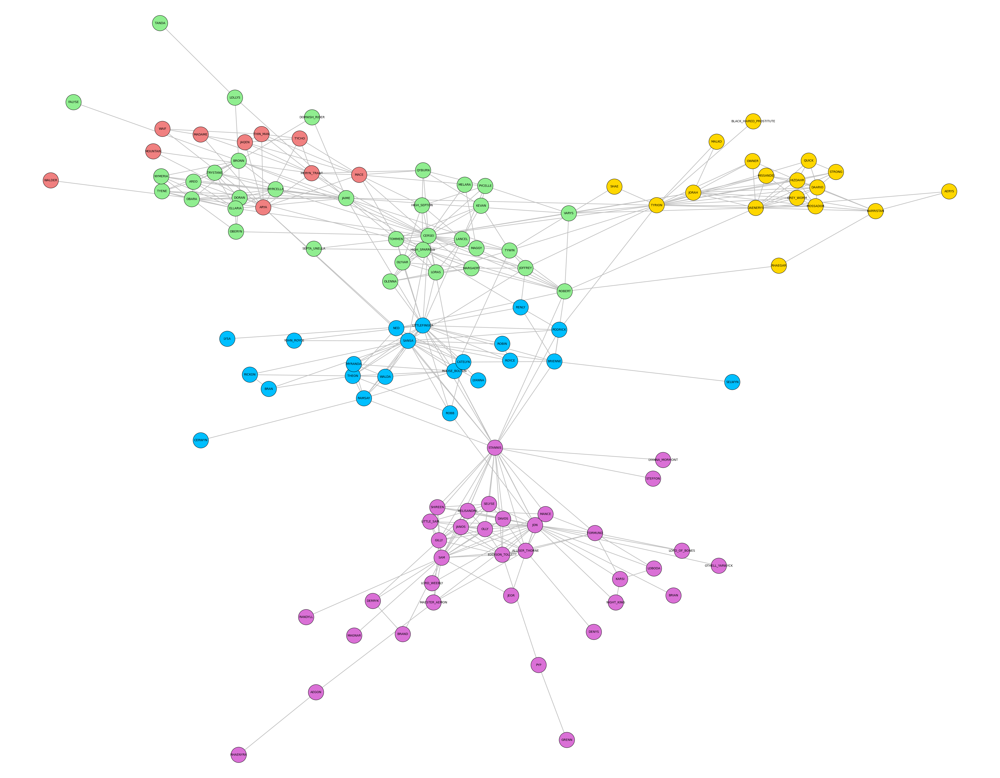

In [56]:
community_graph_layout_gn = nx.spring_layout(G)

colors = ["LightCoral", "Gold", "LightGreen", "DeepSkyBlue", "Orchid", "LightSalmon", "Cyan"]
node_colors = []
node_sizes = []

for node in G.nodes():
    for i, community in enumerate(g_n_comm):
        if node in community:
            node_colors.append(colors[i % len(colors)])
            node_sizes.append(70)
            break


positions = community_graph_layout_gn
g.vs["x"] = [positions[node][0] for node in G.nodes()]
g.vs["y"] = [positions[node][1] for node in G.nodes()]



fig, ax = plt.subplots(figsize=(45, 35))
ax.set_xlim(min(g.vs["x"])-0.05, max(g.vs["x"])+0.05)
ax.set_ylim(min(g.vs["y"])-0.05, max(g.vs["y"])+0.05)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in positions.values()],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"],
    vertex_label_size = 10,
    edge_color = "grey"

)


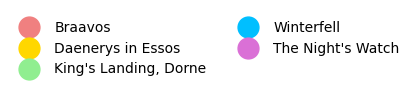

In [57]:
fig_legend, ax_legend = plt.subplots(figsize=(2,1))

# Hardcoding each legend entry
ax_legend.plot([], [], color="LightCoral", marker='o', markersize=15, linestyle='None', label="Braavos")
ax_legend.plot([], [], color="Gold", marker='o', markersize=15, linestyle='None', label="Daenerys in Essos")
ax_legend.plot([], [], color="LightGreen", marker='o', markersize=15, linestyle='None', label="King's Landing, Dorne")
ax_legend.plot([], [], color="DeepSkyBlue", marker='o', markersize=15, linestyle='None', label="Winterfell")
ax_legend.plot([], [], color="Orchid", marker='o', markersize=15, linestyle='None', label="The Night's Watch")

ax_legend.legend(loc='center', frameon=False, ncol=2)
ax_legend.axis('off')

plt.show()

In [58]:
def convertInLabelArray_communities(G, list_of_communities):
    # Initialize the label array with a default value that indicates no community found
    d = []
    num_communities = len(list_of_communities)

    # Create a dictionary to map each node to its community label
    node_to_community = {}
    for community_label, community in enumerate(list_of_communities):
        for node in community:
            node_to_community[node] = community_label

    # Populate the label array based on the node's community
    for node in G.nodes():
        if node in node_to_community:
            d.append(node_to_community[node])
        else:
            d.append(num_communities)  # Assign a label for nodes not in any community

    d = np.array(d)
    return d

In [59]:
#modularity
#modularity = np.round(get_modularity(nx.to_numpy_array(G, weight=None), convertInLabelArray_communities(G, next(com))), 3)

modularity_g_n = round(nx.community.modularity(G, next(com_gn)),3)

print("The Modularity for the Girvan-Newman Nethod is", modularity_g_n)

The Modularity for the Girvan-Newman Nethod is 0.637


### Louvain

In [60]:
louvain_comm = nx.community.louvain_communities(G, seed=123)
n_comm_louvain = len(louvain_comm)
print("Number of communities detected:", n_comm_louvain)

Number of communities detected: 6


In [61]:
# Convert communities to lists and print each one
print("List of the characters, divided per communities:")
for idx, community in enumerate(louvain_comm):
    print(f"Community {idx + 1}: {community}")

List of the characters, divided per communities:
Community 1: {'WAIF', 'MOUNTAIN', 'TYCHO', 'THIN_MAN', 'MERYN_TRANT', 'JAQEN', 'ARYA', 'WALDER', 'MACE', 'MADAME'}
Community 2: {'SHAE', 'MISSANDEI', 'HIZDAHR', 'BARRISTAN', 'VARYS', 'BLACK_HAIRED_PROSTITUTE', 'GREY_WORM', 'MOSSADOR', 'OWNER', 'RHAEGAR', 'TYRION', 'JORAH', 'DAARIO', 'STRONG', 'MALKO', 'DAENERYS', 'QUICK', 'AERYS'}
Community 3: {'OLENNA', 'JOFFREY', 'CERSEI', 'LORAS', 'TOMMEN', 'LANCEL', 'HIGH_SEPTON', 'MAGGY', 'QYBURN', 'OLYVAR', 'ROBERT', 'SEPTA_UNELLA', 'PYCELLE', 'TYWIN', 'KEVAN', 'MARGAERY', 'HIGH_SPARROW', 'MELARA'}
Community 4: {'FALYSE', 'BRONN', 'TRYSTANE', 'JAIME', 'OBARA', 'ELLARIA', 'LOLLYS', 'TYENE', 'TANDA', 'OBERYN', 'DORAN', 'NYMERIA', 'AREO', 'DORNISH_RIDER', 'MYRCELLA'}
Community 5: {'STANNIS', 'JON', 'OLLY', 'SELYSE', 'DENYS', 'NIGHT_KING', 'SHIREEN', 'TORMUND', 'KARSI', 'MAGNAR', 'OTHELL_YARWYCK', 'PYP', 'LORD_WEEBLY', 'ALLISER_THORNE', 'DAVOS', 'GILLY', 'BRIAN', 'MELISANDRE', 'AEGON', 'DERRYK', 'LITTL

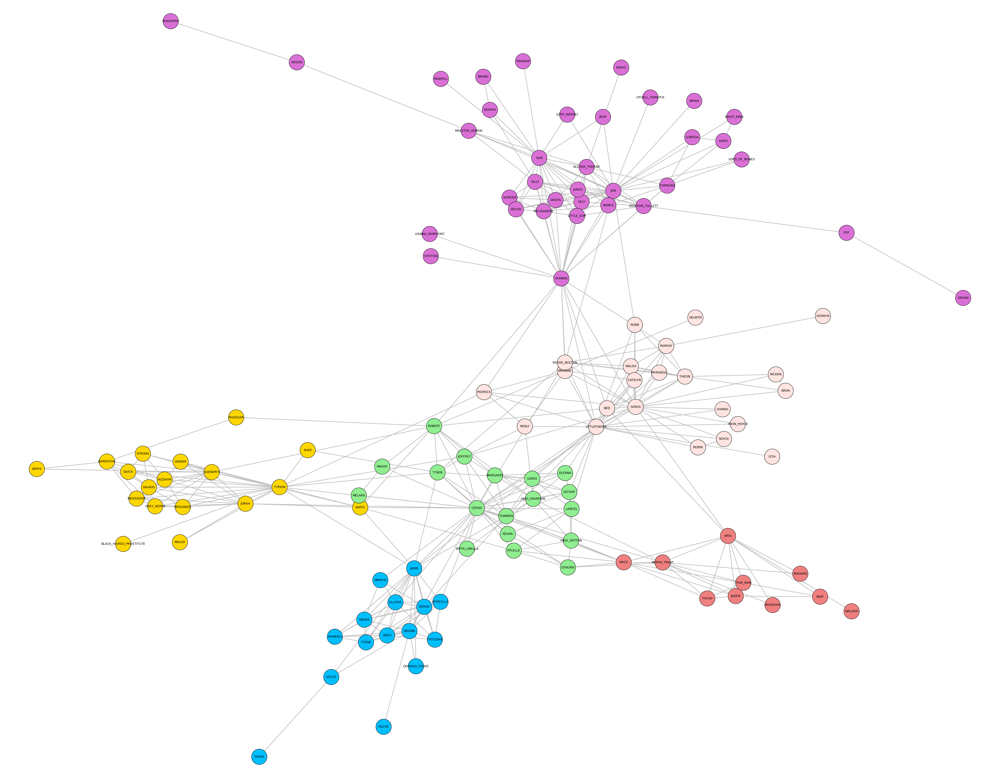

In [62]:
community_graph_layout_louvain = nx.spring_layout(G)

colors = ["LightCoral", "Gold", "LightGreen", "DeepSkyBlue", "Orchid", "MistyRose", "Cyan"]
node_colors = []
node_sizes = []

for node in G.nodes():
    for i, community in enumerate(louvain_comm):
        if node in community:
            node_colors.append(colors[i % len(colors)])
            node_sizes.append(70)
            break


positions = community_graph_layout_louvain
g.vs["x"] = [positions[node][0] for node in G.nodes()]
g.vs["y"] = [positions[node][1] for node in G.nodes()]



fig, ax = plt.subplots(figsize=(45, 35))
ax.set_xlim(min(g.vs["x"])-0.05, max(g.vs["x"])+0.05)
ax.set_ylim(min(g.vs["y"])-0.05, max(g.vs["y"])+0.05)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in positions.values()],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"],
    vertex_label_size = 10,
    edge_color = "grey"

)


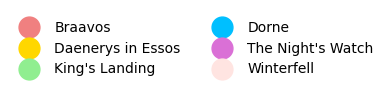

In [63]:
fig_legend, ax_legend = plt.subplots(figsize=(2,1))

# Hardcoding each legend entry
ax_legend.plot([], [], color="LightCoral", marker='o', markersize=15, linestyle='None', label="Braavos")
ax_legend.plot([], [], color="Gold", marker='o', markersize=15, linestyle='None', label="Daenerys in Essos")
ax_legend.plot([], [], color="LightGreen", marker='o', markersize=15, linestyle='None', label="King's Landing")
ax_legend.plot([], [], color="DeepSkyBlue", marker='o', markersize=15, linestyle='None', label="Dorne")
ax_legend.plot([], [], color="Orchid", marker='o', markersize=15, linestyle='None', label="The Night's Watch")
ax_legend.plot([], [], color="MistyRose", marker='o', markersize=15, linestyle='None', label="Winterfell")


ax_legend.legend(loc='center', frameon=False, ncol=2)
ax_legend.axis('off')

plt.show()

In [64]:
modularity_louvain = round(nx.community.modularity(G, louvain_comm),3)
print("The Modularity for the Louvain Method is",modularity_louvain)

The Modularity for the Louvain Method is 0.67


### Greedy Modularity Maximization

In [65]:
gmm_comm = nx.community.greedy_modularity_communities(G)
n_comm_gmm = len(gmm_comm)
print("The number of communities detected are:",n_comm_gmm)

The number of communities detected are: 5


In [66]:
print("List of the characters, divided per communities:")
for idx, community in enumerate(gmm_comm):
    print(f"Cluster {idx + 1}: {community}")

List of the characters, divided per communities:
Cluster 1: frozenset({'STANNIS', 'JON', 'SELYSE', 'OLLY', 'DENYS', 'NIGHT_KING', 'SHIREEN', 'TORMUND', 'KARSI', 'MAGNAR', 'OTHELL_YARWYCK', 'PYP', 'LORD_WEEBLY', 'ALLISER_THORNE', 'DAVOS', 'GILLY', 'BRIAN', 'MELISANDRE', 'AEGON', 'DERRYK', 'LITTLE_SAM', 'RHAENYRA', 'LORD_OF_BONES', 'GRENN', 'RANDYLL', 'SAM', 'JANOS', 'MAESTER_AEMON', 'BRAND', 'EDDISON_TOLLETT', 'LYANNA_MORMONT', 'LOBODA', 'JEOR', 'STEFFON', 'MANCE'})
Cluster 2: frozenset({'OLENNA', 'WAIF', 'JOFFREY', 'TYCHO', 'CERSEI', 'LORAS', 'MERYN_TRANT', 'JAQEN', 'ARYA', 'VARYS', 'MACE', 'WALDER', 'TOMMEN', 'LANCEL', 'HIGH_SEPTON', 'MAGGY', 'QYBURN', 'OLYVAR', 'MOUNTAIN', 'ROBERT', 'SEPTA_UNELLA', 'THIN_MAN', 'PYCELLE', 'TYWIN', 'MADAME', 'KEVAN', 'MARGAERY', 'HIGH_SPARROW', 'MELARA'})
Cluster 3: frozenset({'RENLY', 'BRIENNE', 'RICKON', 'CATELYN', 'ROOSE_BOLTON', 'THEON', 'SANSA', 'CERWYN', 'PODRICK', 'SELWYN', 'LYSA', 'NED', 'LITTLEFINGER', 'WALDA', 'RAMSAY', 'ROYCE', 'BRAN', 'YOHN

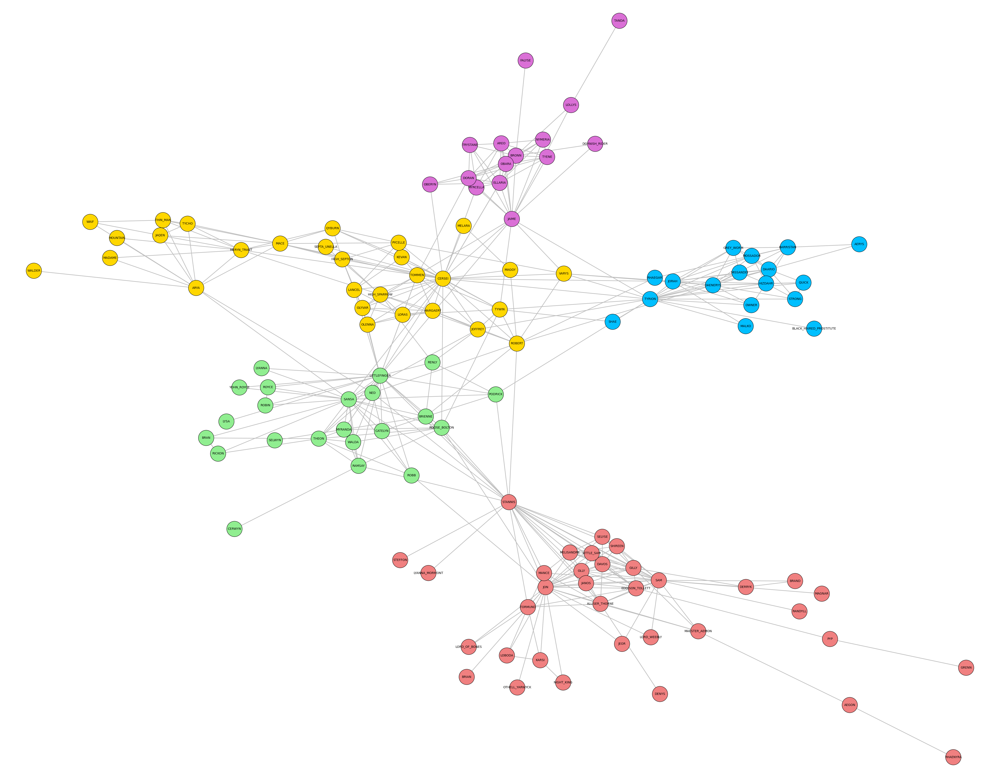

In [67]:
community_graph_layout_gmm = nx.spring_layout(G)

colors = ["LightCoral", "Gold", "LightGreen", "DeepSkyBlue", "Orchid", "MistyRose", "Cyan"]
node_colors = []
node_sizes = []

for node in G.nodes():
    for i, community in enumerate(gmm_comm):
        if node in community:
            node_colors.append(colors[i % len(colors)])
            node_sizes.append(70)
            break


positions = community_graph_layout_gmm
g.vs["x"] = [positions[node][0] for node in G.nodes()]
g.vs["y"] = [positions[node][1] for node in G.nodes()]


fig, ax = plt.subplots(figsize=(45, 35))
ax.set_xlim(min(g.vs["x"])-0.05, max(g.vs["x"])+0.05)
ax.set_ylim(min(g.vs["y"])-0.05, max(g.vs["y"])+0.05)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in positions.values()],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"],
    vertex_label_size = 10,
    edge_color = "grey"

)


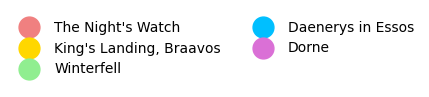

In [68]:
fig_legend, ax_legend = plt.subplots(figsize=(2,1))

# Hardcoding each legend entry
ax_legend.plot([], [], color="LightCoral", marker='o', markersize=15, linestyle='None', label="The Night's Watch")
ax_legend.plot([], [], color="Gold", marker='o', markersize=15, linestyle='None', label="King's Landing, Braavos")
ax_legend.plot([], [], color="LightGreen", marker='o', markersize=15, linestyle='None', label="Winterfell")
ax_legend.plot([], [], color="DeepSkyBlue", marker='o', markersize=15, linestyle='None', label="Daenerys in Essos")
ax_legend.plot([], [], color="Orchid", marker='o', markersize=15, linestyle='None', label="Dorne")


ax_legend.legend(loc='center', frameon=False, ncol=2)
ax_legend.axis('off')

plt.show()

In [69]:
modularity_gmm = round(nx.community.modularity(G, gmm_comm),3)
print("The modularity for Greedy Modularity Maximization is", modularity_gmm)

The modularity for Greedy Modularity Maximization is 0.66


### Spectral Clustering

In [70]:
from sklearn.cluster import SpectralClustering

adj_matrix = nx.to_numpy_array(G)

num_clusters = 6  # Specify the number of communities
spectral_clustering = SpectralClustering(n_clusters=num_clusters, affinity='precomputed', random_state=30)
labels = spectral_clustering.fit_predict(adj_matrix)

community_dict = {node: labels[i] for i, node in enumerate(G.nodes())}
sc_comm = [[] for _ in range(num_clusters)]
for node, comm in community_dict.items():
  sc_comm[comm].append(node)

n_comm_sc = len(sc_comm)

print(f"Spectral Clustering detected {n_comm_sc} communities")
print("List of the characters, divided per communities:")
for idx, community in enumerate(sc_comm):
    print(f"Cluster {idx + 1}: {community}")

Spectral Clustering detected 6 communities
List of the characters, divided per communities:
Cluster 1: ['BRONN', 'JAIME', 'MYRCELLA', 'TYENE', 'DORAN', 'ELLARIA', 'AREO', 'TRYSTANE', 'LOLLYS', 'NYMERIA', 'DORNISH_RIDER', 'OBARA', 'OBERYN', 'FALYSE', 'TANDA']
Cluster 2: ['JON', 'STANNIS', 'SAM', 'GILLY', 'DAVOS', 'TORMUND', 'MELISANDRE', 'SHIREEN', 'OLLY', 'MANCE', 'ALLISER_THORNE', 'KARSI', 'JANOS', 'SELYSE', 'MAESTER_AEMON', 'LOBODA', 'EDDISON_TOLLETT', 'LORD_OF_BONES', 'BRAND', 'DERRYK', 'LITTLE_SAM', 'NIGHT_KING', 'JEOR', 'OTHELL_YARWYCK', 'LORD_WEEBLY', 'DENYS', 'BRIAN', 'PYP', 'GRENN', 'LYANNA_MORMONT', 'MAGNAR', 'RANDYLL', 'STEFFON']
Cluster 3: ['AEGON', 'RHAENYRA']
Cluster 4: ['CERSEI', 'HIGH_SPARROW', 'BRIENNE', 'PODRICK', 'LITTLEFINGER', 'SANSA', 'MARGAERY', 'TOMMEN', 'THEON', 'MYRANDA', 'RAMSAY', 'ROOSE_BOLTON', 'OLENNA', 'LORAS', 'KEVAN', 'MAGGY', 'LANCEL', 'PYCELLE', 'OLYVAR', 'SEPTA_UNELLA', 'HIGH_SEPTON', 'MELARA', 'TYWIN', 'ROYCE', 'WALDA', 'RENLY', 'CATELYN', 'BRAN', 'R

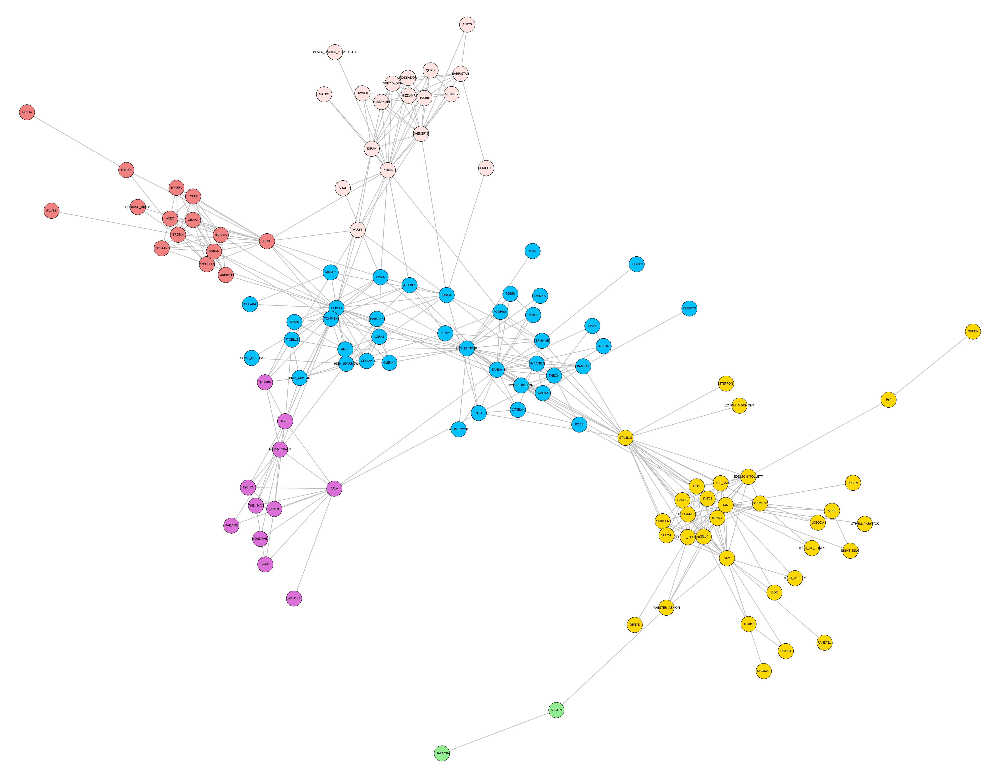

In [71]:
community_graph_layout = nx.spring_layout(G)


colors = ["LightCoral", "Gold", "LightGreen", "DeepSkyBlue", "Orchid", "MistyRose", "Cyan"]
node_colors = []
node_sizes = []

for node in G.nodes():
    for i, community in enumerate(sc_comm):
        if node in community:
            node_colors.append(colors[i % len(colors)])
            node_sizes.append(70)
            break

ig_G = ig.Graph.Weighted_Adjacency(adj_matrix.tolist(), mode=ig.ADJ_UNDIRECTED)
ig_G.vs["Label"] = list(G.nodes())


positions = community_graph_layout
ig_G.vs["x"] = [positions[node][0] for node in G.nodes()]
ig_G.vs["y"] = [positions[node][1] for node in G.nodes()]


fig, ax = plt.subplots(figsize=(45, 35))
ax.set_xlim(min(ig_G.vs["x"])-0.05, max(ig_G.vs["x"])+0.05)
ax.set_ylim(min(ig_G.vs["y"])-0.05, max(ig_G.vs["y"])+0.05)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

ig.plot(
    ig_G,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in positions.values()],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=ig_G.vs["Label"],
    vertex_label_size=10,
    edge_color="grey",
    edge_width=[weight * 2 for weight in ig_G.es['weight']]
)
plt.show()



In [72]:
modularity_sc = round(nx.community.modularity(G, sc_comm),3)
print("The modularity for Spectral Clustering is", modularity_sc)

The modularity for Spectral Clustering is 0.634


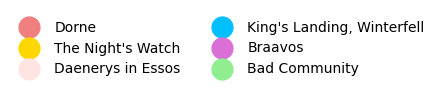

In [73]:
fig_legend, ax_legend = plt.subplots(figsize=(2,1))

# Hardcoding each legend entry
ax_legend.plot([], [], color="LightCoral", marker='o', markersize=15, linestyle='None', label="Dorne")
ax_legend.plot([], [], color="Gold", marker='o', markersize=15, linestyle='None', label="The Night's Watch")
ax_legend.plot([], [], color="MistyRose", marker='o', markersize=15, linestyle='None', label="Daenerys in Essos")
ax_legend.plot([], [], color="DeepSkyBlue", marker='o', markersize=15, linestyle='None', label="King's Landing, Winterfell")
ax_legend.plot([], [], color="Orchid", marker='o', markersize=15, linestyle='None', label="Braavos")
ax_legend.plot([], [], color="LightGreen", marker='o', markersize=15, linestyle='None', label="Bad Community")

ax_legend.legend(loc='center', frameon=False, ncol=2)
ax_legend.axis('off')

plt.show()

### Comparison

In [74]:
community_methods =[]
community_methods.append("Infomap")
community_methods.append("Louvain")
community_methods.append("Girvan-Newmann")
community_methods.append("Greedy M.M.")
community_methods.append("Spectral Clustering")

methods_modularity = []
methods_modularity.append(modularity_infomap)
methods_modularity.append(modularity_louvain)
methods_modularity.append(modularity_g_n)
methods_modularity.append(modularity_gmm)
methods_modularity.append(modularity_sc)

n_communities = []
n_communities.append(n_comm_infomap)
n_communities.append(n_comm_louvain)
n_communities.append(n_comm_g_n)
n_communities.append(n_comm_gmm)
n_communities.append(n_comm_sc)

print("Comparison between Methods: Number of Communities and Modularity")
print(f"Infomap: {n_communities[0]}  -  {methods_modularity[0]}")
print(f"Louvain: {n_communities[1]}  -  {methods_modularity[1]}")
print(f"Girvan-Newman: {n_communities[2]}  -  {methods_modularity[2]}")
print(f"Greedy Modularity Maximization: {n_communities[3]}  -  {methods_modularity[3]}")
print(f"Spectral Clustring: {n_communities[4]}  -  {methods_modularity[4]}")

Comparison between Methods: Number of Communities and Modularity
Infomap: 9  -  0.661
Louvain: 6  -  0.67
Girvan-Newman: 5  -  0.637
Greedy Modularity Maximization: 5  -  0.66
Spectral Clustring: 6  -  0.634


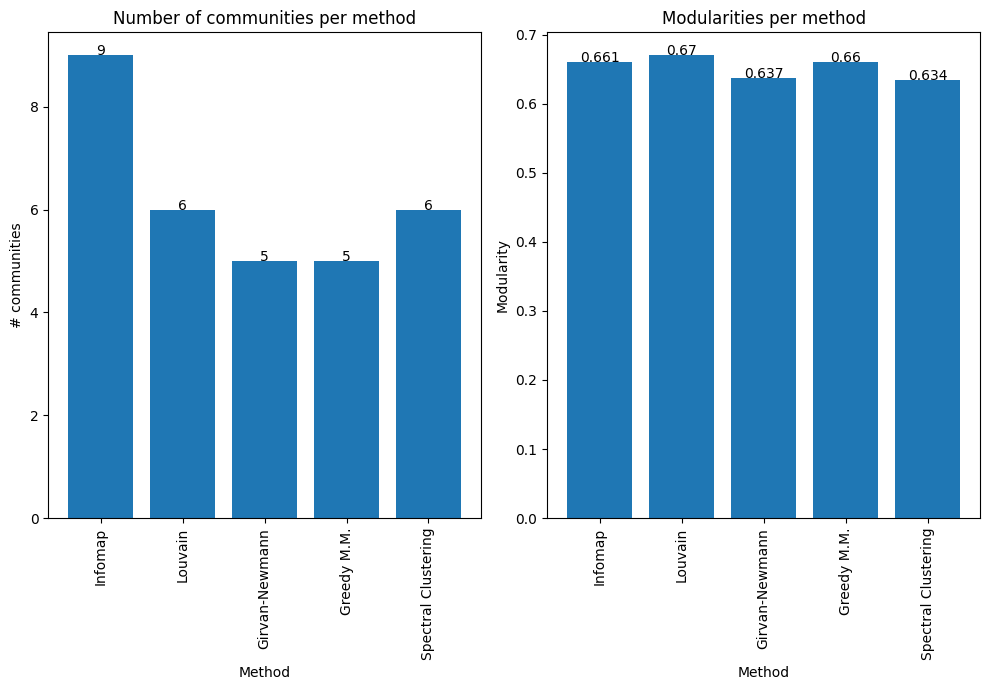

In [75]:
fig, axs = plt.subplots(1, 2, figsize=(10, 7))

# Number of communities per method
axs[0].bar(community_methods, n_communities)
for i, v in enumerate(n_communities):
    axs[0].text(i, v, str(v), ha='center', color='black')
axs[0].set_xlabel("Method")
axs[0].set_ylabel("# communities")
axs[0].set_title("Number of communities per method")
axs[0].set_xticks(range(len(community_methods)))
axs[0].set_xticklabels(community_methods, rotation='vertical')

# Modularities per method
axs[1].bar(community_methods, methods_modularity)
for i, v in enumerate(methods_modularity):
    axs[1].text(i, v, str(v), ha='center', color='black')
axs[1].set_xlabel("Method")
axs[1].set_ylabel("Modularity")
axs[1].set_title("Modularities per method")
axs[1].set_xticks(range(len(community_methods)))
axs[1].set_xticklabels(community_methods, rotation='vertical')

plt.tight_layout()
plt.show()

## Robustness

### Random Nodes Removal

In [114]:
import random
import numpy as np
import networkx as nx

random_seed = 30
random.seed(random_seed)

def random_removal(graph, nodes):
    graph_copy = graph.copy()
    nodes_to_remove = random.sample(list(graph_copy.nodes()), nodes)
    graph_copy.remove_nodes_from(nodes_to_remove)
    return graph_copy

random_res = {}
graphs = []
n_sample_to_remove = [5, 10, 15, 20, 25, 30, 35]

for i in n_sample_to_remove:
    new_graph = random_removal(G, i)
    a = nx.connected_components(new_graph)
    components = [len(c) for c in sorted(a, key=len, reverse=True)]

    # Compute all the new metrics
    betweenness_centrality = nx.betweenness_centrality(new_graph)
    closeness_centrality = nx.closeness_centrality(new_graph)
    harmonic_centrality = nx.harmonic_centrality(new_graph)
    degree_centrality = nx.degree_centrality(new_graph)

    try:
        eigenvector_centrality = nx.eigenvector_centrality(new_graph)
    except nx.PowerIterationFailedConvergence:
        eigenvector_centrality = {node: float('nan') for node in new_graph.nodes()}

    # Five most central nodes
    first5_bcen = list(dict(sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)).keys())[0:5]
    first5_ccen = list(dict(sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)).keys())[0:5]
    first5_ecen = list(dict(sorted(eigenvector_centrality.items(), key=lambda x: x[1], reverse=True)).keys())[0:5]
    first5_charm = list(dict(sorted(harmonic_centrality.items(), key=lambda x: x[1], reverse=True)).keys())[0:5]
    first5_cdegree = list(dict(sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)).keys())[0:5]

    # Mean centrality
    mean_bcen = np.mean(list(betweenness_centrality.values()))
    mean_ccen = np.mean(list(closeness_centrality.values()))
    mean_ecen = np.mean(list(eigenvector_centrality.values()))
    mean_charm = np.mean(list(harmonic_centrality.values()))
    mean_cdegree = np.mean(list(degree_centrality.values()))

    # Metric about the giant component
    Gcc = sorted(nx.connected_components(new_graph), key=len, reverse=True)
    giant_component = new_graph.subgraph(Gcc[0])

    avg_shortest_path = nx.average_shortest_path_length(giant_component)
    d = nx.diameter(giant_component)

    # Dictionary
    random_res[i] = {
        'average shortest path': avg_shortest_path,
        'diameter': d,
        '5 most central nodes - betweenness centrality': first5_bcen,
        '5 most central nodes - closeness centrality': first5_ccen,
        '5 most central nodes - eigenvector centrality': first5_ecen,
        '5 most central nodes - harmonic centrality': first5_charm,
        '5 most central nodes - degree centrality': first5_cdegree,
        'Mean betweenness centrality': mean_bcen,
        'Mean closeness centrality': mean_ccen,
        'Mean eigenvector centrality': mean_ecen,
        'Mean harmonic centrality': mean_charm,
        'Mean degree centrality': mean_cdegree,
        'number of components': len(components)
    }
    graphs.append(new_graph)

# Output the results
for k, v in random_res.items():
    print(f"Nodes removed: {k}")
    for metric, value in v.items():
        print(f"{metric}: {value}")
    print("\n")


Nodes removed: 5
average shortest path: 3.234725634725635
diameter: 7
5 most central nodes - betweenness centrality: ['STANNIS', 'CERSEI', 'LITTLEFINGER', 'JON', 'ROBERT']
5 most central nodes - closeness centrality: ['LITTLEFINGER', 'CERSEI', 'STANNIS', 'SANSA', 'ROOSE_BOLTON']
5 most central nodes - eigenvector centrality: ['STANNIS', 'JON', 'SAM', 'LITTLEFINGER', 'SANSA']
5 most central nodes - harmonic centrality: ['CERSEI', 'LITTLEFINGER', 'STANNIS', 'SANSA', 'JON']
5 most central nodes - degree centrality: ['CERSEI', 'LITTLEFINGER', 'JON', 'STANNIS', 'SANSA']
Mean betweenness centrality: 0.019423184246193097
Mean closeness centrality: 0.30597925003588416
Mean eigenvector centrality: 0.06491798144249547
Mean harmonic centrality: 39.46999578592499
Mean degree centrality: 0.05515170670037926
number of components: 3


Nodes removed: 10
average shortest path: 3.2331256490134996
diameter: 8
5 most central nodes - betweenness centrality: ['STANNIS', 'CERSEI', 'LITTLEFINGER', 'JON', 'TYR

In [115]:
for i in n_sample_to_remove:
  print(random_res[i])

{'average shortest path': 3.234725634725635, 'diameter': 7, '5 most central nodes - betweenness centrality': ['STANNIS', 'CERSEI', 'LITTLEFINGER', 'JON', 'ROBERT'], '5 most central nodes - closeness centrality': ['LITTLEFINGER', 'CERSEI', 'STANNIS', 'SANSA', 'ROOSE_BOLTON'], '5 most central nodes - eigenvector centrality': ['STANNIS', 'JON', 'SAM', 'LITTLEFINGER', 'SANSA'], '5 most central nodes - harmonic centrality': ['CERSEI', 'LITTLEFINGER', 'STANNIS', 'SANSA', 'JON'], '5 most central nodes - degree centrality': ['CERSEI', 'LITTLEFINGER', 'JON', 'STANNIS', 'SANSA'], 'Mean betweenness centrality': 0.019423184246193097, 'Mean closeness centrality': 0.30597925003588416, 'Mean eigenvector centrality': 0.06491798144249547, 'Mean harmonic centrality': 39.46999578592499, 'Mean degree centrality': 0.05515170670037926, 'number of components': 3}
{'average shortest path': 3.2331256490134996, 'diameter': 8, '5 most central nodes - betweenness centrality': ['STANNIS', 'CERSEI', 'LITTLEFINGER',

In [116]:
#Get the nodes that now are without any link
for i in range(len(n_sample_to_remove)):
  Gcc = sorted(nx.connected_components(graphs[i]), key=len, reverse=True)
  if len(Gcc) > 1:
    Gcc.pop(0)
    print("Isolated nodes in the network: ",i, "is", Gcc)

Isolated nodes in the network:  0 is [{'BLACK_HAIRED_PROSTITUTE'}, {'SHAE'}]
Isolated nodes in the network:  2 is [{'BLACK_HAIRED_PROSTITUTE'}, {'MADAME'}, {'MOUNTAIN'}, {'WALDER'}, {'SELWYN'}]
Isolated nodes in the network:  3 is [{'BLACK_HAIRED_PROSTITUTE'}, {'LYSA'}, {'BRIAN'}]
Isolated nodes in the network:  4 is [{'DERRYK', 'BRAND'}, {'BLACK_HAIRED_PROSTITUTE'}, {'DENYS'}, {'SELWYN'}, {'RANDYLL'}]
Isolated nodes in the network:  5 is [{'RHAENYRA'}, {'TANDA'}]
Isolated nodes in the network:  6 is [{'RHAENYRA'}, {'FALYSE'}, {'CERWYN'}]


### Preferential Attachment - Link Prediction

In [117]:
#preferential attachment
preds = nx.preferential_attachment(G, list(nx.non_edges(G)))

first_node = []
sec_node = []
score = []

for u, v, p in preds:
  first_node.append(u)
  sec_node.append(v)
  score.append(p)

preferential_attachment = pd.DataFrame(data = list(zip(first_node, sec_node, score)),
                             columns = ['First node', 'Second node', 'Score'])

preferential_attachment = preferential_attachment.sort_values("Score", ascending=False)
preferential_attachment

,First node,Second node,Score
2376,JON,CERSEI,750
2278,STANNIS,CERSEI,720
2426,JON,LITTLEFINGER,625
4628,CERSEI,SAM,600
2409,JON,SANSA,525
...,...,...,...
4523,STEFFON,GRENN,1
4524,STEFFON,RANDYLL,1
4964,MAGNAR,BRIAN,1
4963,MAGNAR,FALYSE,1


### Node Prediction

In [118]:
#Returns a random graph using Barabási–Albert preferential attachment
#A graph of nodes is grown by attaching new nodes each with edges that are preferentially attached to existing nodes with high degree.

#the first number n is how many node we want to have in the new graph (old + new nodes)
#and the second number m is the umber of edges to attach from a new node to existing nodes

#Barabási–Albert network must have m >= 1 and m < n
one_node_one_edge = nx.barabasi_albert_graph(len(G.nodes())+1, 1, seed=30, initial_graph=G)

In [119]:
#adding a new node - preferential attachment
preds = nx.preferential_attachment(one_node_one_edge, one_node_one_edge.edges())

first_node = []
sec_node = []
score = []

for u, v, p in preds:
  first_node.append(u)
  sec_node.append(v)
  score.append(p)

preferential_attachment = pd.DataFrame(data = list(zip(first_node, sec_node, score)),
                             columns = ['First node', 'Second node', 'Score'])

preferential_attachment = preferential_attachment.sort_values("Score", ascending=False)
preferential_attachment[(preferential_attachment["First node"] == len(G)) | (preferential_attachment["Second node"] == len(G))]

,First node,Second node,Score
366,TYCHO,118,6


In [120]:
#Returns a random graph using Barabási–Albert preferential attachment
#A graph of nodes is grown by attaching new nodes each with edges that are preferentially attached to existing nodes with high degree.

#the first number n is how many node we want to have in the new graph (old + new nodes)
#and the second number m is the umber of edges to attach from a new node to existing nodes

#Barabási–Albert network must have m >= 1 and m < n
one_node_ten_edge = nx.barabasi_albert_graph(len(G.nodes())+1, 10, seed=30, initial_graph=G)

In [121]:
#adding a new node - preferential attachment
preds = nx.preferential_attachment(one_node_ten_edge, one_node_ten_edge.edges())

first_node = []
sec_node = []
score = []

for u, v, p in preds:
  first_node.append(u)
  sec_node.append(v)
  score.append(p)

preferential_attachment = pd.DataFrame(data = list(zip(first_node, sec_node, score)),
                             columns = ['First node', 'Second node', 'Score'])

preferential_attachment = preferential_attachment.sort_values("Score", ascending=False)
preferential_attachment[(preferential_attachment["First node"] == len(G)) | (preferential_attachment["Second node"] == len(G))]

,First node,Second node,Score
202,LITTLEFINGER,118,260
236,SAM,118,210
45,TYRION,118,200
58,BRONN,118,130
388,TYWIN,118,110
322,OLLY,118,110
259,MARGAERY,118,90
394,WALDA,118,70
372,TYCHO,118,60
384,DORNISH_RIDER,118,30


In [122]:
#Returns a random graph using Barabási–Albert preferential attachment
#A graph of nodes is grown by attaching new nodes each with edges that are preferentially attached to existing nodes with high degree.

#the first number n is how many node we want to have in the new graph (old + new nodes)
#and the second number m is the umber of edges to attach from a new node to existing nodes

#Barabási–Albert network must have m >= 1 and m < n
nodes_to_add = 10
ten_node_three_edge = nx.barabasi_albert_graph(len(G.nodes())+nodes_to_add, int(davg), seed=30, initial_graph=G)

In [123]:
#adding a new node - preferential attachment
preds = nx.preferential_attachment(ten_node_three_edge, ten_node_three_edge.edges())

first_node = []
sec_node = []
score = []

for u, v, p in preds:
  first_node.append(u)
  sec_node.append(v)
  score.append(p)

preferential_attachment = pd.DataFrame(data = list(zip(first_node, sec_node, score)),
                             columns = ['First node', 'Second node', 'Score'])

preferential_attachment = preferential_attachment.sort_values("Score", ascending=False)
filtered_preferential_attachment = preferential_attachment[(preferential_attachment['First node'].isin(np.arange(len(G.nodes()), len(G.nodes())+nodes_to_add))) |
                                                           (preferential_attachment['Second node'].isin(np.arange(len(G.nodes()), len(G.nodes())+nodes_to_add)))]
filtered_preferential_attachment

,First node,Second node,Score
123,CERSEI,127,198
122,CERSEI,125,198
121,CERSEI,124,198
251,SAM,120,175
174,JON,121,156
216,LITTLEFINGER,119,156
253,SAM,126,150
252,SAM,123,150
254,SAM,127,150
250,SAM,119,150


In [124]:
filtered_preferential_attachment_counts = filtered_preferential_attachment['First node'].value_counts()
filtered_preferential_attachment_counts

,count
First node,
SAM,5
CERSEI,3
OLLY,3
JORAH,2
WALDA,2
CATELYN,2
THEON,2
HIZDAHR,2
DERRYK,2


In [125]:
filtered_chars =  list(dict(filtered_preferential_attachment_counts).keys())[0:10]
filtered_values = list(dict(filtered_preferential_attachment_counts).values())[0:10]

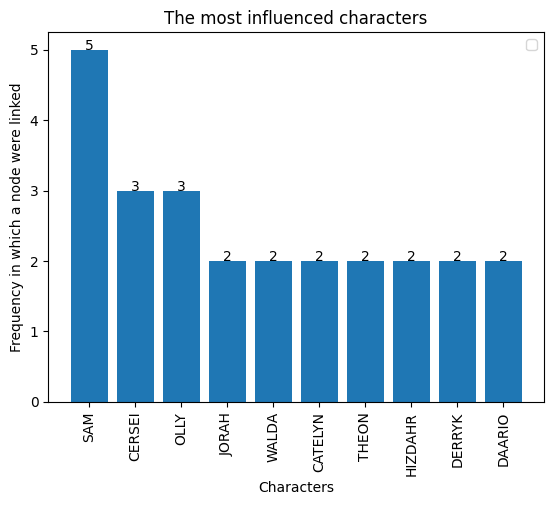

In [126]:
#Modularities per method

"""
Function that we'll use later for add the value in barplots
"""
def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i, y[i], y[i], ha = 'center')

plt.bar(filtered_chars,filtered_values)
addlabels(filtered_chars,filtered_values)
plt.legend()
plt.xticks(rotation='vertical')
plt.xlabel("Characters")
plt.ylabel("Frequency in which a node were linked")
plt.title("The most influenced characters")
plt.show()